In [1]:
import matplotlib.pyplot as plt

# for reloading of modules
import importlib
from helpers import bohmian_integrator
from helpers import logging, physics_1d_sim_with_damping, plotting_spin, video_spin, data
from helpers import bohmian_plotter

def reload_modules():
	importlib.reload(logging)
	
	importlib.reload(physics_1d_sim_with_damping)
	# importlib.reload(plotting_spin)
	# importlib.reload(video_spin)
	# importlib.reload(data)
	# importlib.reload(bohmian_integrator)
	# importlib.reload(bohmian_plotter)

# Call this whenever you need to reload the modules
reload_modules()

# Then your regular imports
from helpers.logging import *
from helpers.physics_1d_sim_with_damping import *

## Delta Barrier

## Cosine Mask

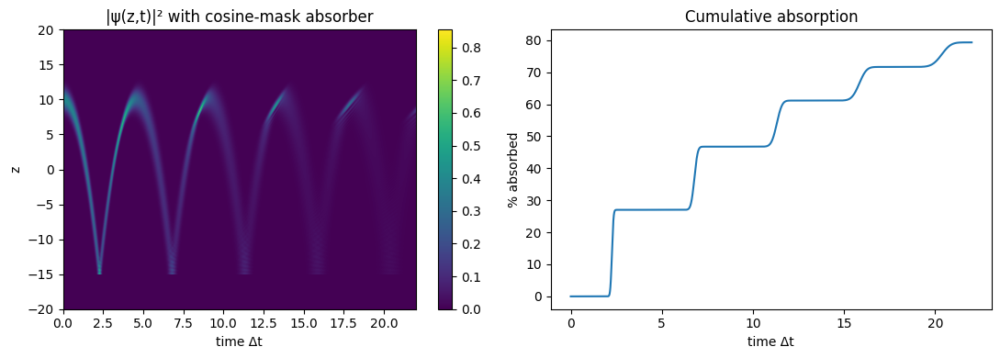

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Example usage: delta barrier
barrier_params_delta = {'z0': 0.0, 'alpha': 0.0}
z_array, t_vals, prob_arr, loss, psi_history = simulate_n(
	
	n_steps=22000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	# absorbing potential
	absorber_type="cosine_mask",
	absorber_params=dict(width=5.0, p=10),

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with cosine‑mask absorber")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals, loss * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% absorbed")
ax[1].set_title("Cumulative absorption")
plt.tight_layout()
plt.show()

## poly_cap

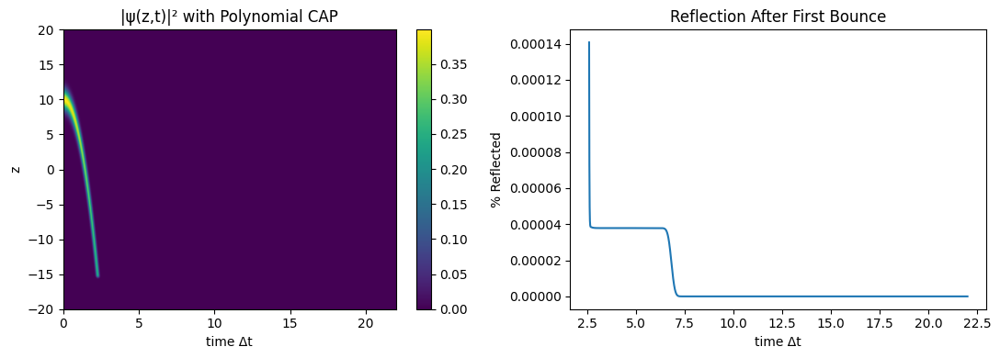

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Now plot the spacetime density
# plot_spacetime(prob_arr[2500:][:], z_array, t_vals[2500:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

barrier_params_delta = {'z0': 0.0, 'alpha': 0.0}
z_array, t_vals, prob_arr, loss, psi_history = simulate_n(
	
	n_steps=22000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	# absorbing potential
	absorber_type="poly_cap",
	absorber_params=dict(width=5.0, n=2, eta=10000.0),

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with Polynomial CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[2600:], (1-loss[2600:]) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Reflected")
ax[1].set_title("Reflection After First Bounce")
plt.tight_layout()
plt.show()

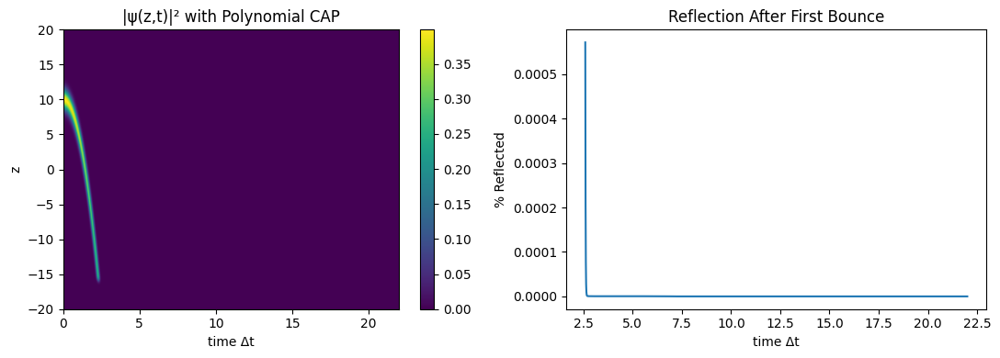

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Now plot the spacetime density
# plot_spacetime(prob_arr[2500:][:], z_array, t_vals[2500:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

barrier_params_delta = {'z0': 0.0, 'alpha': 0.0}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(
	
	n_steps=22000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	# absorbing potential
	absorber_type="poly_cap",
	absorber_params=dict(width=5.0, n=2, eta=1000.0),

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with Polynomial CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[2600:], (1-loss[2600:]) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Reflected")
ax[1].set_title("Reflection After First Bounce")
plt.tight_layout()
plt.show()

Polynomial with n=2, and $\eta = 1000$ seems to work best.

In [20]:
Nx = 512*2
dz = z_array[1] - z_array[0]

In [22]:
Nx/2-10/dz

256.2499999999998

In [70]:
import numpy as np
from sklearn.model_selection import ParameterGrid
from tqdm import tqdm  # for progress tracking

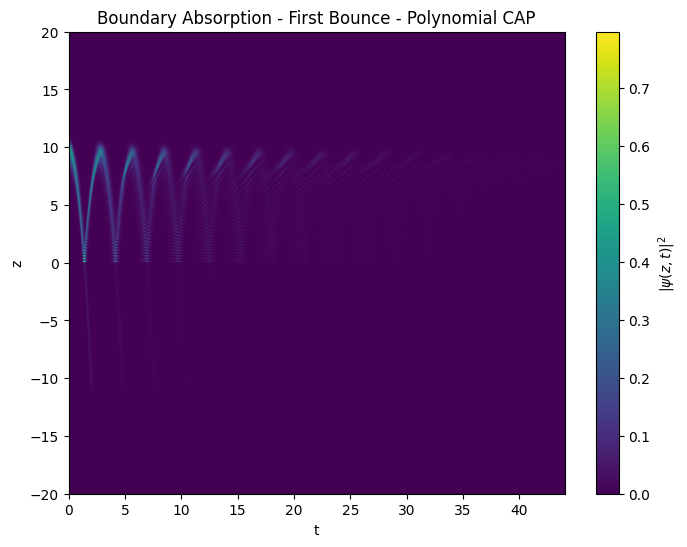

In [91]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Example usage: delta barrier
barrier_params_delta = {'z0': 0.0, 'alpha': 20.0}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(
	
	n_steps=44000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512*2,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	apply_parabolic_dwell=False,
	strength=100,
	z_dwell_start=-10,

	# absorbing potential
	absorber_type="poly_cap",
	absorber_params=dict(width=10.0, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
plot_spacetime(prob_arr[:][:], z_array, t_vals[:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

Text(0.5, 1.0, 'Potential plot')

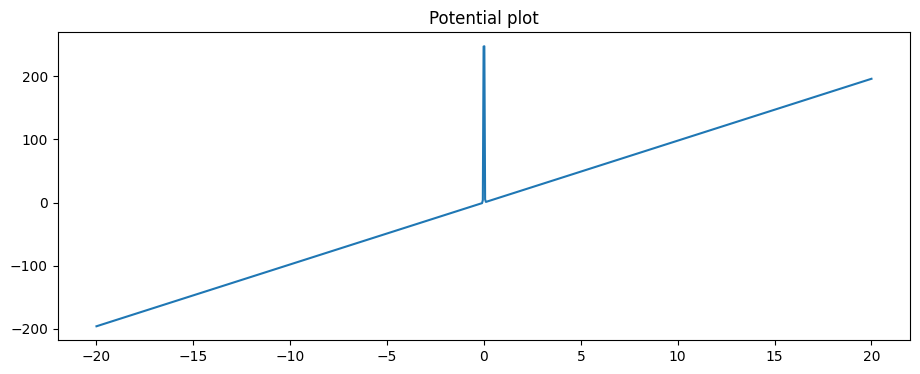

In [92]:
# plot potential
V_tot

fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(z_array, V_tot)
ax.set_title("Potential plot")

Text(0.5, 1.0, 'Arrival Time Distribution')

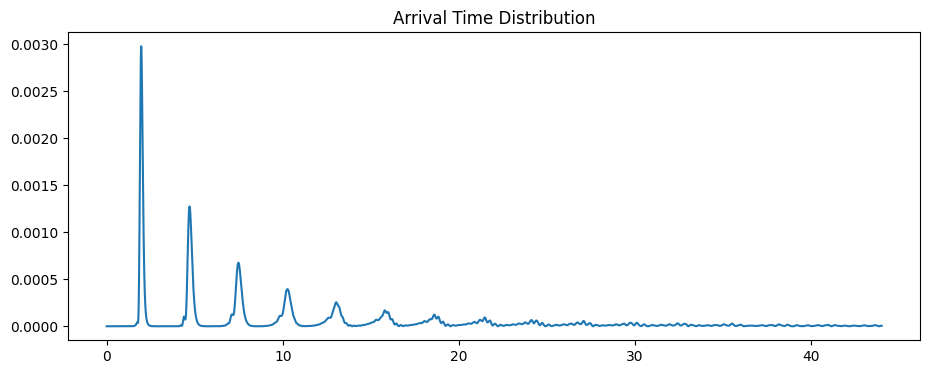

In [93]:
J = - (hbar / (m)) * np.imag(
		np.conj(psi_history) * np.gradient(psi_history, axis=0)
	)

dz = z_array[1]-z_array[0]
position = -10

JSlice = J[:, int(512/2+position*dz)]
fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(t_vals, JSlice)
ax.set_title("Arrival Time Distribution")

In [94]:
np.sum(JSlice<0)

150

## Grid Searching best parameter for our simulation

In [113]:
def objective_function(width, n, eta):
	"""Calculate number of negative J values for given parameters."""
	# Run simulation with current parameters
	z_array, t_vals, prob_arr, loss, psi_history, V_tot = simulate_n(
		n_steps=44000,
		dt=0.001,
		x_min=-20, x_max=20, Nx=512*2,
		barrier_type='delta',
		barrier_params={'z0': 0.0, 'alpha': 20.0},
		apply_parabolic_dwell=False,
		strength=100,
		z_dwell_start=-10,
		absorber_type="poly_cap",
		absorber_params=dict(width=width, n=n, eta=eta),
		z0_packet=10.0,
		p0_packet=0.0
	)
	
	# Calculate J
	J = -(hbar / m) * np.imag(
		np.conj(psi_history) * np.gradient(psi_history, axis=0)
	)
	
	# Calculate JSlice at position -10
	dz = z_array[1] - z_array[0]
	position = -10
	JSlice = J[:, int(512/2 + position/dz)]
	
	# Count negative values
	neg_count = np.sum(JSlice < 0)
	
	return neg_count, JSlice, t_vals

# Define parameter grid
param_grid = {
	'n': np.linspace(2, 6, 5),  # [2,3,4,5,6,7,8]
	'eta': np.linspace(500, 5000, 10),  # [500, 750, 1000, 1250, 1500, 1750, 2000]
	'width': np.linspace(2, 15, 13)
}

# Create grid search
grid = ParameterGrid(param_grid)

# Store results
results = []

# Perform grid search
for params in tqdm(grid):
	neg_count, JSlice, t_vals = objective_function(params['width'], params['n'], params['eta'])
	results.append({
		'n': params['n'],
		'eta': params['eta'],
		'width': params['width'],
		'neg_count': neg_count
	})

# Convert results to numpy array for easier analysis
results_array = np.array([(r['n'], r['eta'], r['width'], r['neg_count']) for r in results])

# Find best parameters
best_idx = np.argmin(results_array[:, 2])
best_n = results_array[best_idx, 0]
best_eta = results_array[best_idx, 1]
best_score = results_array[best_idx, 2]

# Plot results as a heatmap
n_unique = len(param_grid['n'])
eta_unique = len(param_grid['eta'])
heatmap_data = results_array[:, 2].reshape(n_unique, eta_unique)

plt.figure(figsize=(10, 8))
plt.imshow(heatmap_data, 
		  extent=[min(param_grid['eta']), max(param_grid['eta']),
				  min(param_grid['n']), max(param_grid['n'])],
		  aspect='auto',
		  origin='lower',
		  cmap='viridis')
plt.colorbar(label='Number of negative J values')
plt.xlabel('eta')
plt.ylabel('n')
plt.title('Grid Search Results')

# Mark best point
plt.plot(best_eta, best_n, 'r*', markersize=15, label=f'Best: n={best_n:.2f}, eta={best_eta:.2f}')
plt.legend()

print(f"Best parameters found:")
print(f"n = {best_n:.2f}")
print(f"eta = {best_eta:.2f}")
print(f"Number of negative J values = {best_score}")

# Plot J for best parameters
best_neg_count, best_JSlice, best_t_vals = objective_function(best_n, best_eta)

plt.figure(figsize=(11, 4))
plt.plot(best_t_vals, best_JSlice)
plt.title(f"Arrival Time Distribution for Best Parameters (n={best_n:.2f}, eta={best_eta:.2f})")
plt.xlabel('Time')
plt.ylabel('J')
plt.grid(True)
plt.show()

100%|██████████| 650/650 [31:35<00:00,  2.92s/it]


ValueError: cannot reshape array of size 650 into shape (5,10)

In [114]:
# Find best parameters
best_idx = np.argmin(results_array[:, 3])
best_n = results_array[best_idx, 0]
best_eta = results_array[best_idx, 1]
best_width = results_array[best_idx, 2]
best_score = results_array[best_idx, 3]

In [115]:
print (f"Best score {best_score} for n={best_n}, eta={best_eta}, width={best_width}")

Best score 20.0 for n=2.0, eta=5000.0, width=12.833333333333332


Thus we still have a slice of 143 or something, which is quite outrageous....

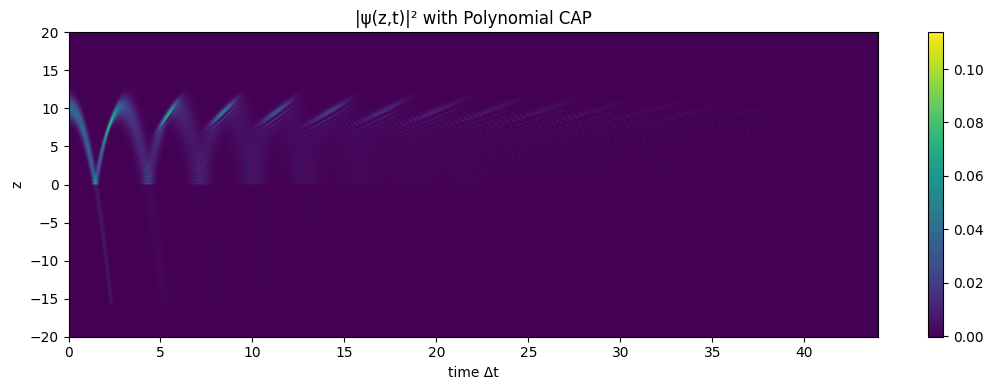

In [104]:
# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 1, figsize=(11, 4))
# density plot
im = ax.imshow(J.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax.set_xlabel("time Δt")
ax.set_ylabel("z")
ax.set_title("|ψ(z,t)|² with Polynomial CAP")
fig.colorbar(im, ax=ax)
plt.tight_layout()
plt.show()

Running the experiment for the best procedure

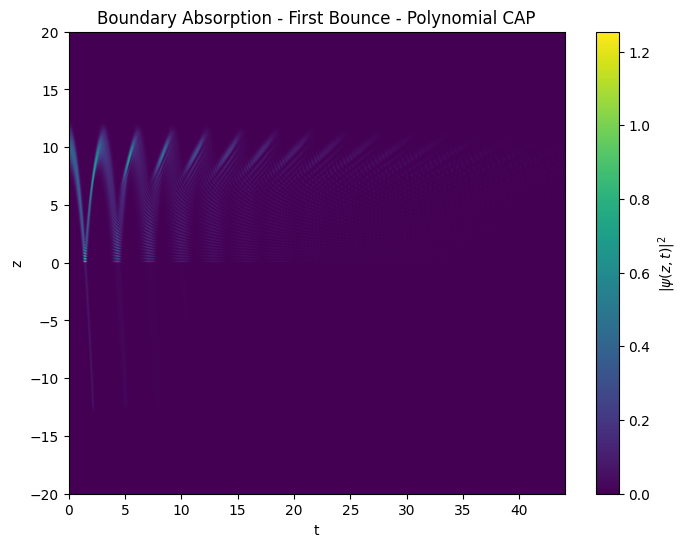

In [117]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Example usage: delta barrier
barrier_params_delta = {'z0': 0.0, 'alpha': 20.0}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(
	
	n_steps=44000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512*2,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	apply_parabolic_dwell=False,
	strength=100,
	z_dwell_start=-10,

	# absorbing potential
	absorber_type="poly_cap",
	absorber_params=dict(width=8, n=2, eta=5000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
plot_spacetime(prob_arr[:][:], z_array, t_vals[:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

Text(0.5, 1.0, 'Arrival Time Distribution')

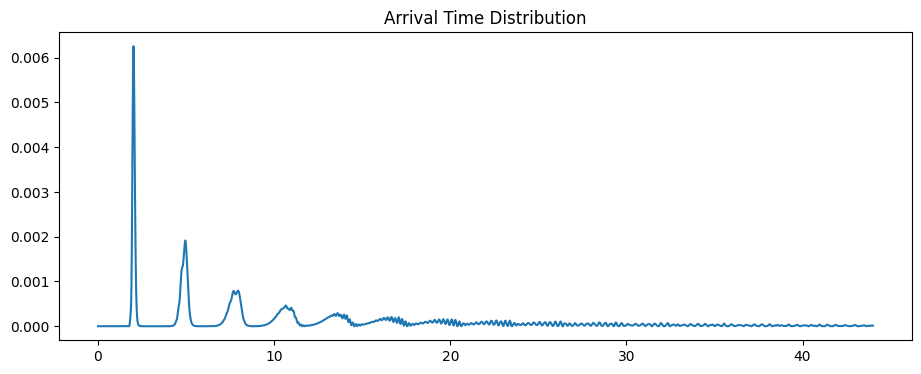

In [118]:
J = - (hbar / (m)) * np.imag(
		np.conj(psi_history) * np.gradient(psi_history, axis=0)
	)

dz = z_array[1]-z_array[0]
position = -10

JSlice = J[:, int(512/2+position*dz)]
fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(t_vals, JSlice)
ax.set_title("Arrival Time Distribution")

In [112]:
np.sum(JSlice<0)

204

## Working - Polynomial CAP

In [181]:
import matplotlib.pyplot as plt

# for reloading of modules
import importlib
from helpers import bohmian_integrator
from helpers import logging, physics_1d_sim_with_damping, plotting_spin, video_spin, data
from helpers import bohmian_plotter

def reload_modules():
	importlib.reload(logging)
	
	importlib.reload(physics_1d_sim_with_damping)

# Call this whenever you need to reload the modules
reload_modules()

# Then your regular imports
from helpers.logging import *
from helpers.physics_1d_sim_with_damping import *

eta: 2000.0, n: 2


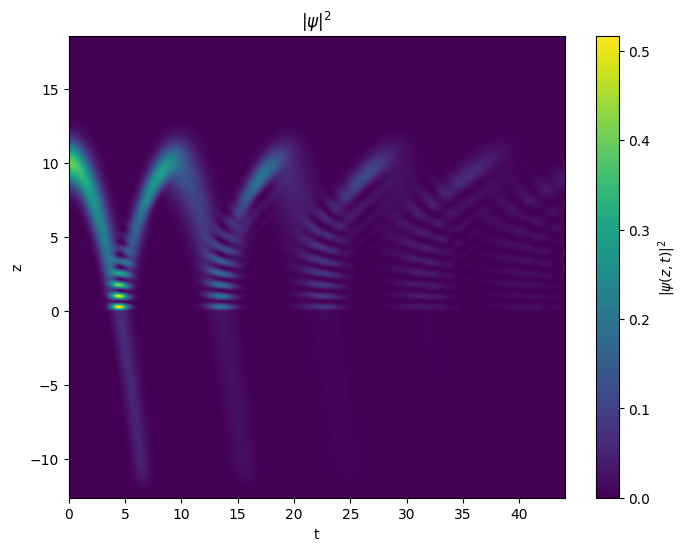

In [304]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Example usage: delta barrier
barrier_params_delta = {'z0': 0.0, 'alpha': 5.0}
params = {
	"n_steps":44000,
	"dt":0.001,
	"x_min":-40, "x_max":40, "Nx":512*2*2,

	#
	"barrier_type": 'delta',
	"barrier_params": barrier_params_delta,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"z0_packet": 10.0,
	"p0_packet": 0.0
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

# Now plot the spacetime density
plot_spacetime(prob_arr[:, 700:1500], z_array[700:1500], t_vals[:], title="$|\psi|^2$", log_scale=True)

In [109]:
prob_arr.shape

(44000, 2048)

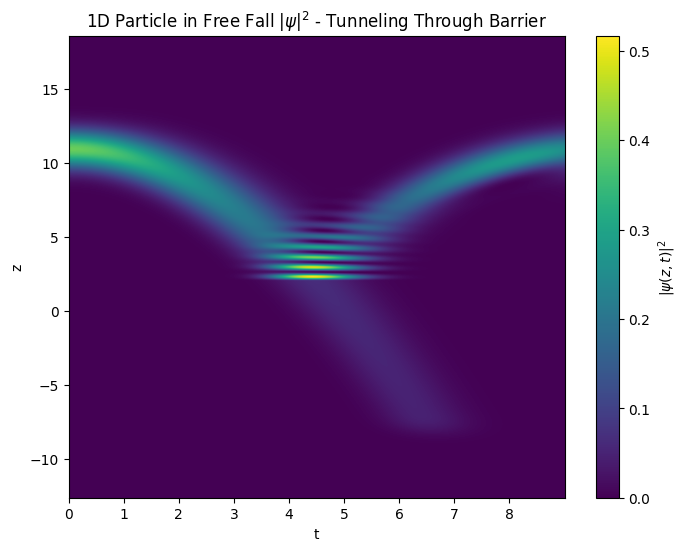

In [137]:
plot_spacetime(prob_arr[:9000, 600:1500], z_array[700:1500], t_vals[:9000], title="1D Particle in Free Fall $|\psi|^2$ - Tunneling Through Barrier", log_scale=False)

Text(0.5, 1.0, 'Arrival Time Distribution')

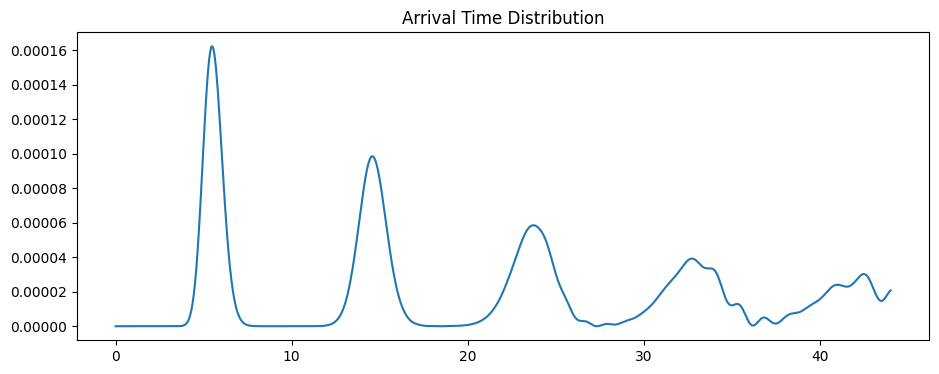

In [183]:
J = - (hbar / (m)) * np.imag(
		np.conj(psi_history) * np.gradient(psi_history, axis=0)
	)

dz = z_array[1]-z_array[0]
position = -5

JSlice = J[:, int(params["Nx"]/2+position/dz)]
fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(t_vals[:], JSlice[:])
ax.set_title("Arrival Time Distribution")

## Arrival Times At varrying Gamma potentials

In [185]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results = []
gamma_values = [0.5, 2, 5, 10, 20]

for z in gamma_values:

	# Example usage: delta barrier
	barrier_params_delta = {'z0': 0.0, 'alpha': z}
	params = {
		"n_steps":44000,
		"dt":0.001,
		"x_min":-40, "x_max":40, "Nx":512*2*2,

		#
		"barrier_type": 'delta',
		"barrier_params": barrier_params_delta,

		# apply_parabolic_dwell=False,
		# strength=100,
		# z_dwell_start=-10,

		# absorbing potential
		"absorber_type": "poly_cap",
		"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

		# initial wave function
		"z0_packet": 10.0,
		"p0_packet": 0.0
	}
	z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

	J = - (hbar / (m)) * np.imag(
			np.conj(psi_history) * np.gradient(psi_history, axis=0)
		)

	dz = z_array[1]-z_array[0]
	position = -5

	JSlice = J[:, int(params["Nx"]/2+position/dz)]

	j_results.append(JSlice)

	# fix, ax = plt.subplots(1,1, figsize=(11,4))
	# im = ax.plot(t_vals[:], JSlice[:])
	# ax.set_title("Arrival Time Distribution")

eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2


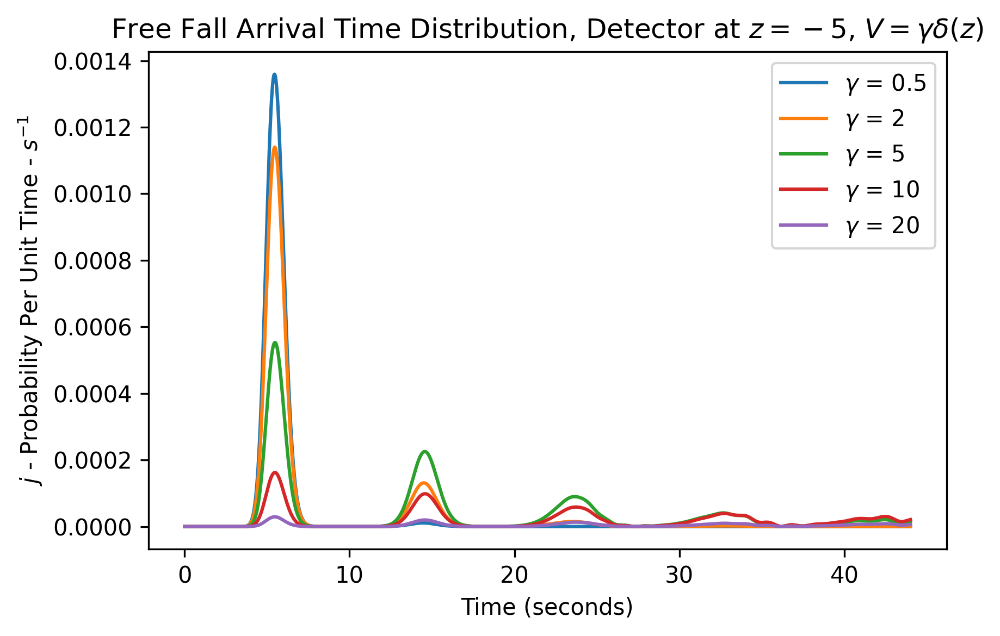

In [192]:
fix, ax = plt.subplots(1,1, figsize=(6,4))
fix.dpi = 300
for ii, j in enumerate(j_results):
	im = ax.plot(t_vals[:], j[:], label=f"$\gamma$ = {gamma_values[ii]}")
	ax.set_title("Free Fall Arrival Time Distribution, Detector at $z=-5$, $V = \gamma \delta(z)$")
	ax.legend()
	ax.set_xlabel("Time (seconds)")
	ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
	
# Move plt.show() outside the loop
fix.tight_layout()
plt.show()

Changing Kinetic Energies, same Delta

In [194]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results = []
gamma_values = [8]
z0_values = [12, 15, 25]

for z0 in z0_values:

	# Example usage: delta barrier
	barrier_params_delta = {'z0': 0, 'alpha': gamma_values[0]}
	params = {
		"n_steps":88000,
		"dt":0.001,
		"x_min":-40, "x_max":40, "Nx":512*2,

		#
		"barrier_type": 'delta',
		"barrier_params": barrier_params_delta,

		# apply_parabolic_dwell=False,
		# strength=100,
		# z_dwell_start=-10,

		# absorbing potential
		"absorber_type": "poly_cap",
		"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

		# initial wave function
		"z0_packet": z0,
		"p0_packet": 0.0
	}
	z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

	J = - (hbar / (m)) * np.imag(
			np.conj(psi_history) * np.gradient(psi_history, axis=0)
		)

	dz = z_array[1]-z_array[0]
	position = -5

	JSlice = J[:, int(params["Nx"]/2+position/dz)]

	j_results.append(JSlice)

	# fix, ax = plt.subplots(1,1, figsize=(11,4))
	# im = ax.plot(t_vals[:], JSlice[:])
	# ax.set_title("Arrival Time Distribution")

eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2


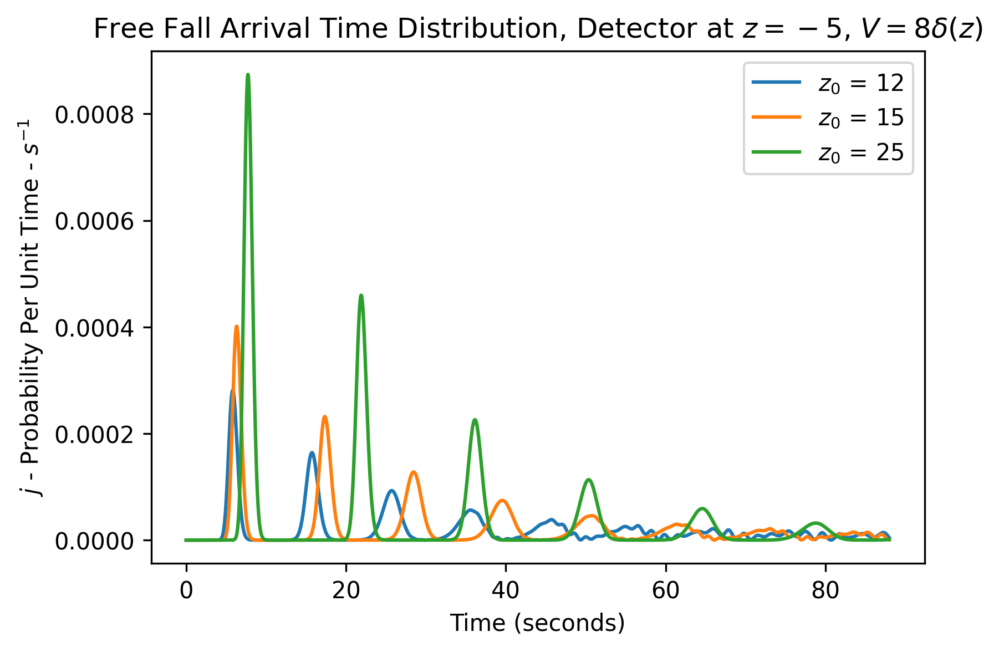

In [196]:
fix, ax = plt.subplots(1,1, figsize=(6,4))
fix.dpi = 300
for ii, j in enumerate(j_results):
	im = ax.plot(t_vals[:], j[:], label=f"$z_0$ = {z0_values[ii]}")
	ax.set_title("Free Fall Arrival Time Distribution, Detector at $z=-5$, $V = 8 \delta(z)$")
	ax.legend()
	ax.set_xlabel("Time (seconds)")
	ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
# Move plt.show() outside the loop
plt.show()

Perhaps we ought to compare with semi-classical approaches here?

## Gaussian Barrier Simulation

In [201]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results = []
gamma_values = [8]
z0_values = [12, 15, 25]

for z0 in z0_values:

	# Example usage: delta barrier
	barrier_params_gaussian = {'z0': 0.0, 'V0': 15, 'sigma': 1}
	params = {
		"n_steps":44000,
		"dt":0.001,
		"x_min":-40, "x_max":40, "Nx":512*2,

		#
		"barrier_type": 'gaussian',
		"barrier_params": barrier_params_gaussian,

		# apply_parabolic_dwell=False,
		# strength=100,
		# z_dwell_start=-10,

		# absorbing potential
		"absorber_type": "poly_cap",
		"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

		# initial wave function
		"z0_packet": z0,
		"p0_packet": 0.0
	}
	z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

	J = - (hbar / (m)) * np.imag(
			np.conj(psi_history) * np.gradient(psi_history, axis=0)
		)

	dz = z_array[1]-z_array[0]
	position = -5

	JSlice = J[:, int(params["Nx"]/2+position/dz)]

	j_results.append(JSlice)

	# fix, ax = plt.subplots(1,1, figsize=(11,4))
	# im = ax.plot(t_vals[:], JSlice[:])
	# ax.set_title("Arrival Time Distribution")
	# fix.show()

eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2


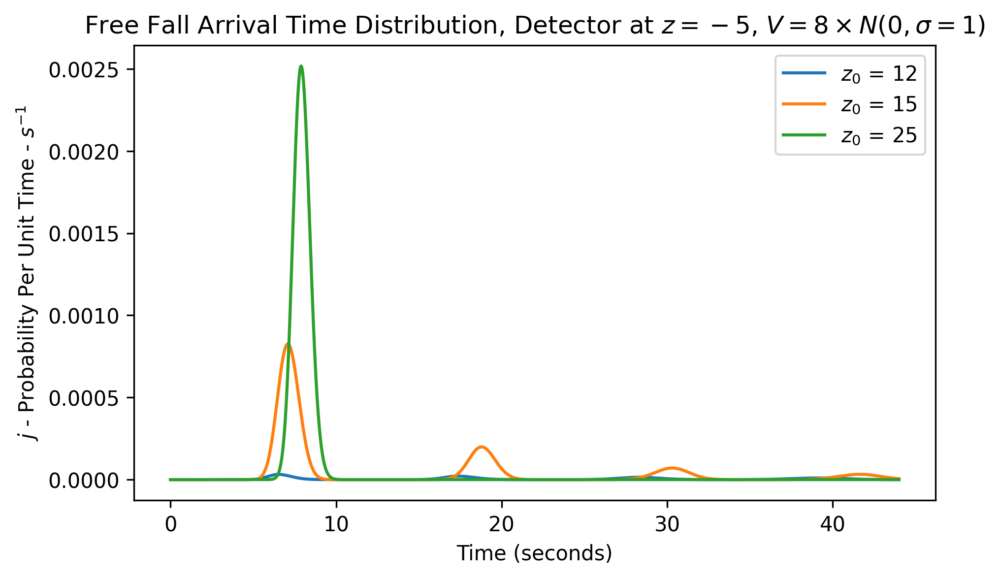

In [202]:
fix, ax = plt.subplots(1,1, figsize=(7,4))
fix.dpi = 300
for ii, j in enumerate(j_results):
	im = ax.plot(t_vals[:], j[:], label=f"$z_0$ = {z0_values[ii]}")
	ax.set_title("Free Fall Arrival Time Distribution, Detector at $z=-5$, $V = 8 \\times N(0, \sigma=1)$")
	ax.legend()
	ax.set_xlabel("Time (seconds)")
	ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
# Move plt.show() outside the loop
plt.show()

In [205]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results = []
gamma_values = range(1, 10, 1)
z0_values = [10]

for v0 in gamma_values:

	# Example usage: delta barrier
	barrier_params_gaussian = {'z0': 0.0, 'V0': v0, 'sigma': 1}
	params = {
		"n_steps":44000,
		"dt":0.001,
		"x_min":-40, "x_max":40, "Nx":512*2*2,

		#
		"barrier_type": 'gaussian',
		"barrier_params": barrier_params_gaussian,

		# apply_parabolic_dwell=False,
		# strength=100,
		# z_dwell_start=-10,

		# absorbing potential
		"absorber_type": "poly_cap",
		"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

		# initial wave function
		"z0_packet": z0_values[0],
		"p0_packet": 0.0
	}
	z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

	J = - (hbar / (m)) * np.imag(
			np.conj(psi_history) * np.gradient(psi_history, axis=0)
		)

	dz = z_array[1]-z_array[0]
	position = -5

	JSlice = J[:, int(params["Nx"]/2+position/dz)]

	j_results.append(JSlice)

	# fix, ax = plt.subplots(1,1, figsize=(11,4))
	# im = ax.plot(t_vals[:], JSlice[:])
	# ax.set_title("Arrival Time Distribution")
	# fix.show()

eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2
eta: 2000.0, n: 2


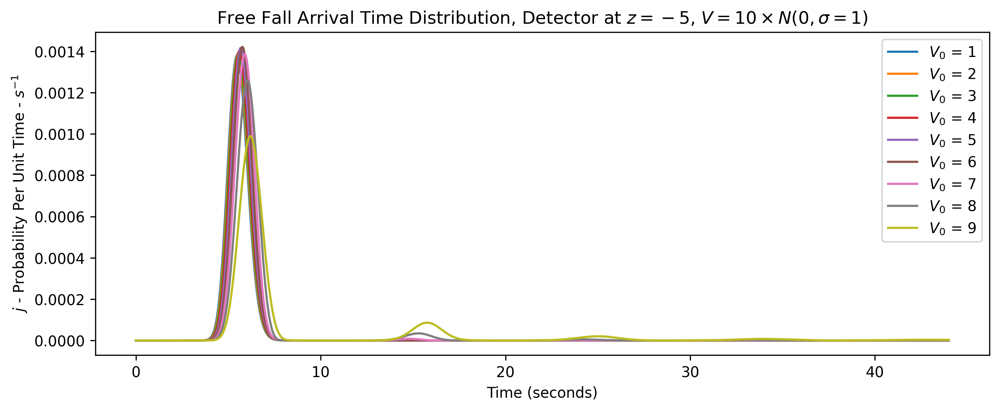

In [206]:
fix, ax = plt.subplots(1,1, figsize=(11,4))
fix.dpi = 300
for ii, j in enumerate(j_results):
	im = ax.plot(t_vals[:], j[:], label=f"$V_0$ = {gamma_values[ii]}")
	ax.set_title("Free Fall Arrival Time Distribution, Detector at $z=-5$, $V = 10 \\times N(0, \sigma=1)$")
	ax.legend()
	ax.set_xlabel("Time (seconds)")
	ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
# Move plt.show() outside the loop
plt.show()

I'm going to find the amplitude of the first peak, then plot for a whole series what the amplitude is, against a value of $V_0$.

In [535]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results_donna = {}
z0_values = [5, 10, 20]

dt = 0.001
for z0 in z0_values:

	gamma_values = [i*0.125 for i in range(z0 *20)]

	for v0 in gamma_values:

		print (f"Doing run z0={z0}, at v0={v0}")

		# Example usage: delta barrier
		# barrier_params_gaussian = {'z0': 0.0, 'V0': v0, 'sigma': 1}
		delta_params = {'z0': 0.0, 'alpha': v0}
		params = {
			"n_steps":50000,
			"dt": 0.001,
			"x_min":-40, "x_max":40, "Nx":512*2,

			#
			"barrier_type": 'delta',
			"barrier_params": delta_params,

			# apply_parabolic_dwell=False,
			# strength=100,
			# z_dwell_start=-10,

			# absorbing potential
			"absorber_type": "poly_cap",
			"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

			# initial wave function
			"z0_packet": z0,
			"p0_packet": 0.0,

			"use_yoshida": True
		}
		z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

		J = - (hbar / (m)) * np.imag(
				np.conj(psi_history) * np.gradient(psi_history, axis=0)
			)

		dz = z_array[1]-z_array[0]
		position = -5

		JSlice = J[:, int(params["Nx"]/2+position/dz)]

		if (z0 in j_results_donna):
			j_results_donna[z0].append(JSlice.copy())
		else:
			j_results_donna[z0] = []
			j_results_donna[z0].append(JSlice.copy())

		# memory cleaning
		del J, z_array, t_vals, prob_arr, loss, psi_history, V_tot

t_vals = np.linspace(0, 0.001 * 50000, 50000)

import pickle
import datetime
import os

# # Create filename
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H-%M")
filename = os.path.join('./results/data', f'freefall_delta_height_0_125_yoshida_fourth_order_{timestamp}.pkl')

# # # # Save to pickle file
with open(filename, 'wb') as f:
	pickle.dump(j_results_donna, f)

# Load the data
# filename_0_5_v0_resolution = "freefall_1d_three_heights_seriesofbarrierstrengthds_20250513_11-37.pkl"
# filename_0_25_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"
# filename_0_125_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"

# drop height variation
# filename_ss = "freefall_0_5_energy_change_yoshida_fourth_order_20250517_20-03.pkl"
# filename = os.path.join('./results/data', filename_ss)
# j_results_donna = pickle.load(open(filename, 'rb'))

Doing run z0=5, at v0=0.0
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.125
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.25
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.375
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.5
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.625
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.75
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.875
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.0
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.125
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.25
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.375
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.5
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.625
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.75
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.875
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.0
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.125
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.25
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.375
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.5
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.625
eta: 2000.0, n: 2
Doing

In [536]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results_donna = {}
dt = 0.001

gamma_values = [5, 10, 15, 20]
for v0 in gamma_values:

	z0_values = [i*0.125 for i in range(8*35)]

	for z0 in z0_values:

		print (f"Doing run z0={z0}, at v0={v0}")

		# Example usage: delta barrier
		# barrier_params_gaussian = {'z0': 0.0, 'V0': v0, 'sigma': 1}
		delta_params = {'z0': 0.0, 'alpha': v0}
		params = {
			"n_steps":50000,
			"dt": 0.001,
			"x_min":-40, "x_max":40, "Nx":512*2,

			#
			"barrier_type": 'delta',
			"barrier_params": delta_params,

			# apply_parabolic_dwell=False,
			# strength=100,
			# z_dwell_start=-10,

			# absorbing potential
			"absorber_type": "poly_cap",
			"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

			# initial wave function
			"z0_packet": z0,
			"p0_packet": 0.0,

			"use_yoshida": True
		}
		z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

		J = - (hbar / (m)) * np.imag(
				np.conj(psi_history) * np.gradient(psi_history, axis=0)
			)

		dz = z_array[1]-z_array[0]
		position = -5

		JSlice = J[:, int(params["Nx"]/2+position/dz)]

		if (z0 in j_results_donna):
			j_results_donna[z0].append(JSlice.copy())
		else:
			j_results_donna[z0] = []
			j_results_donna[z0].append(JSlice.copy())

		# memory cleaning
		del J, z_array, t_vals, prob_arr, loss, psi_history, V_tot

t_vals = np.linspace(0, 0.001 * 50000, 50000)

import pickle
import datetime
import os

# # Create filename
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H-%M")
filename = os.path.join('./results/data', f'freefall_delta_strength_0_125_yoshida_fourth_order_{timestamp}.pkl')

# # # # Save to pickle file
with open(filename, 'wb') as f:
	pickle.dump(j_results_donna, f)

# Load the data
# filename_0_5_v0_resolution = "freefall_1d_three_heights_seriesofbarrierstrengthds_20250513_11-37.pkl"
# filename_0_25_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"
# filename_0_125_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"

# drop height variation
# filename_ss = "freefall_0_5_energy_change_yoshida_fourth_order_20250517_20-03.pkl"
# filename = os.path.join('./results/data', filename_ss)
# j_results_donna = pickle.load(open(filename, 'rb'))

Doing run z0=0.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.125, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.375, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.625, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.75, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.875, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.125, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.375, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.625, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.75, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.875, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.125, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.375, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.625, at v0=5
eta: 2000.0, n: 2
Doing

In [537]:
## This one is for doing 1028 for gaussian, just to double check

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results_donna = {}
z0_values = [5, 10, 20]

dt = 0.001
for z0 in z0_values:

	gamma_values = [i*0.125 for i in range(z0 *20)]

	for v0 in gamma_values:

		print (f"Doing run z0={z0}, at v0={v0}")

		# Example usage: delta barrier
		barrier_params_gaussian = {'z0': 0.0, 'V0': v0, 'sigma': 1}
		# delta_params = {'z0': 0.0, 'alpha': v0}
		params = {
			"n_steps":50000,
			"dt": 0.001,
			"x_min":-40, "x_max":40, "Nx":512*2,

			#
			"barrier_type": 'gaussian',
			"barrier_params": barrier_params_gaussian,

			# apply_parabolic_dwell=False,
			# strength=100,
			# z_dwell_start=-10,

			# absorbing potential
			"absorber_type": "poly_cap",
			"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

			# initial wave function
			"z0_packet": z0,
			"p0_packet": 0.0,

			"use_yoshida": True
		}
		z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

		J = - (hbar / (m)) * np.imag(
				np.conj(psi_history) * np.gradient(psi_history, axis=0)
			)

		dz = z_array[1]-z_array[0]
		position = -5

		JSlice = J[:, int(params["Nx"]/2+position/dz)]

		if (z0 in j_results_donna):
			j_results_donna[z0].append(JSlice.copy())
		else:
			j_results_donna[z0] = []
			j_results_donna[z0].append(JSlice.copy())

		# memory cleaning
		del J, z_array, t_vals, prob_arr, loss, psi_history, V_tot

t_vals = np.linspace(0, 0.001 * 50000, 50000)

import pickle
import datetime
import os

# # Create filename
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H-%M")
filename = os.path.join('./results/data', f'freefall_gaussian_height_0_125_1028_yoshida_fourth_order_{timestamp}.pkl')

# # # # Save to pickle file
with open(filename, 'wb') as f:
	pickle.dump(j_results_donna, f)

# Load the data
# filename_0_5_v0_resolution = "freefall_1d_three_heights_seriesofbarrierstrengthds_20250513_11-37.pkl"
# filename_0_25_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"
# filename_0_125_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"

# drop height variation
# filename_ss = "freefall_0_5_energy_change_yoshida_fourth_order_20250517_20-03.pkl"
# filename = os.path.join('./results/data', filename_ss)
# j_results_donna = pickle.load(open(filename, 'rb'))

Doing run z0=5, at v0=0.0
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.125
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.25
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.375
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.5
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.625
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.75
eta: 2000.0, n: 2
Doing run z0=5, at v0=0.875
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.0
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.125
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.25
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.375
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.5
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.625
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.75
eta: 2000.0, n: 2
Doing run z0=5, at v0=1.875
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.0
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.125
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.25
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.375
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.5
eta: 2000.0, n: 2
Doing run z0=5, at v0=2.625
eta: 2000.0, n: 2
Doing

In [538]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results_donna = {}
dt = 0.001

gamma_values = [5, 10, 15, 20]
for v0 in gamma_values:

	z0_values = [i*0.125 for i in range(8*35)]

	for z0 in z0_values:

		print (f"Doing run z0={z0}, at v0={v0}")

		# Example usage: delta barrier
		barrier_params_gaussian = {'z0': 0.0, 'V0': v0, 'sigma': 1}
		# delta_params = {'z0': 0.0, 'alpha': v0}
		params = {
			"n_steps":50000,
			"dt": 0.001,
			"x_min":-40, "x_max":40, "Nx":512*2,

			#
			"barrier_type": 'gaussian',
			"barrier_params": barrier_params_gaussian,

			# apply_parabolic_dwell=False,
			# strength=100,
			# z_dwell_start=-10,

			# absorbing potential
			"absorber_type": "poly_cap",
			"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

			# initial wave function
			"z0_packet": z0,
			"p0_packet": 0.0,

			"use_yoshida": True
		}
		z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

		J = - (hbar / (m)) * np.imag(
				np.conj(psi_history) * np.gradient(psi_history, axis=0)
			)

		dz = z_array[1]-z_array[0]
		position = -5

		JSlice = J[:, int(params["Nx"]/2+position/dz)]

		if (z0 in j_results_donna):
			j_results_donna[z0].append(JSlice.copy())
		else:
			j_results_donna[z0] = []
			j_results_donna[z0].append(JSlice.copy())

		# memory cleaning
		del J, z_array, t_vals, prob_arr, loss, psi_history, V_tot

t_vals = np.linspace(0, 0.001 * 50000, 50000)

import pickle
import datetime
import os

# # Create filename
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H-%M")
filename = os.path.join('./results/data', f'freefall_gaussian_strength_0_125_1028_yoshida_fourth_order_{timestamp}.pkl')

# # # # Save to pickle file
with open(filename, 'wb') as f:
	pickle.dump(j_results_donna, f)

# Load the data
# filename_0_5_v0_resolution = "freefall_1d_three_heights_seriesofbarrierstrengthds_20250513_11-37.pkl"
# filename_0_25_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"
# filename_0_125_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"

# drop height variation
# filename_ss = "freefall_0_5_energy_change_yoshida_fourth_order_20250517_20-03.pkl"
# filename = os.path.join('./results/data', filename_ss)
# j_results_donna = pickle.load(open(filename, 'rb'))

Doing run z0=0.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.125, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.375, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.625, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.75, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.875, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.125, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.375, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.625, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.75, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.875, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.125, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.375, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.625, at v0=5
eta: 2000.0, n: 2
Doing

In [251]:
t_vals = np.linspace(0, 0.001 * 50000, 50000)

In [529]:
t_vals = np.linspace(0, 0.001 * 50000, 50000)

import pickle
import datetime
import os

# # Create filename
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H-%M")
filename = os.path.join('./results/data', f'freefall_0_125_yoshida_fourth_order_{timestamp}.pkl')

# # # # Save to pickle file
with open(filename, 'wb') as f:
	pickle.dump(j_results_donna, f)

# Load the data
# filename_0_5_v0_resolution = "freefall_1d_three_heights_seriesofbarrierstrengthds_20250513_11-37.pkl"
# filename_0_25_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"
# filename_0_125_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"

# drop height variation
filename_ss = "freefall_0_5_energy_change_yoshida_fourth_order_20250517_20-03.pkl"
filename = os.path.join('./results/data', filename_ss)
j_results_donna = pickle.load(open(filename, 'rb'))

In [107]:
def find_first_peak(array, peak=0, threshold=0.0000001):
	"""
	Find the first significant peak in an array.
	
	Parameters:
	-----------
	array : numpy.ndarray
		The input array to analyze
	threshold : float, optional
		Minimum height difference to consider a point as a peak (default: 0.1)
		
	Returns:
	--------
	tuple
		(peak_index, peak_value) or (None, None) if no peak is found
	"""
	# Find all peaks using scipy's find_peaks
	from scipy.signal import find_peaks
	
	# Find peaks with minimum height difference
	# peaks, properties = find_peaks(array, prominence=0.1 * np.max(array))
	peaks, properties = find_peaks(array, height=np.max(array)*0.0001)
	
	if len(peaks) >= peak+1:
		# Get peak
		first_peak_idx = peaks[peak]
		first_peak_val = array[first_peak_idx]
		return first_peak_idx, first_peak_val
	else:
		return None, None


ValueError: x and y must have same first dimension, but have shapes (44000,) and (50000,)

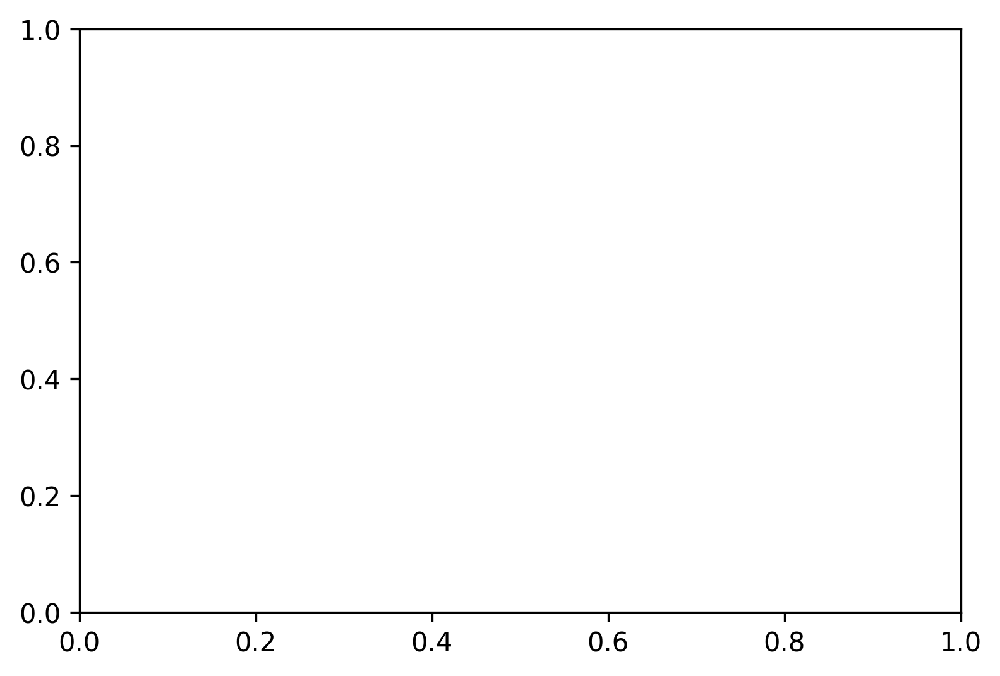

In [221]:
# Simple single use
fix, ax = plt.subplots(1,1, figsize=(6,4))
fix.dpi = 300

# use [5, 10, 20], and then for different values of v0
j = j_results_donna[5][30]

im = ax.plot(t_vals, j, label=f"$V_0$ = {10}")

first_peak_idx, first_peak_val = find_first_peak(j)
second_peak_idx, second_peak_val = find_first_peak(j, 1)
third_peak_idx, third_peak_val = find_first_peak(j, 2)

if first_peak_idx is not None:

	ax.scatter(t_vals[first_peak_idx], first_peak_val)

if second_peak_idx is not None:
	ax.scatter(t_vals[second_peak_idx], second_peak_val)

if third_peak_idx is not None:
	ax.scatter(t_vals[third_peak_idx], third_peak_val)

# Fit exponential to peaks
# try:
# 	# lambda_coeff, amplitude, peak_indices, peak_values = fit_exponential_to_peaks(t_vals, j, threshold=0.000000001)
	
# 	# Plot the peaks
# 	ax.plot(t_vals[peak_indices], peak_values, 'ro', label='Peaks')
	
# 	# Plot the fitted exponential
# 	t_fit = np.linspace(min(t_vals), max(t_vals), 100)
# 	y_fit = amplitude * np.exp(-lambda_coeff * t_fit)
# 	ax.plot(t_fit, y_fit, '--', label=f'Fit: $\lambda$={lambda_coeff:.3f}')
	
# 	print(f"Decay rate (λ): {lambda_coeff:.3f}")
# 	print(f"Amplitude: {amplitude:.3f}")
	
# except ValueError as e:
# 	print(f"Could not fit exponential: {e}")

# 	# break

ax.set_title("Fit of Arrival Time Distribution Peaks with Exponential Fit")
ax.legend()
	
	
plt.show()

In [222]:
j_results.keys()

NameError: name 'j_results' is not defined

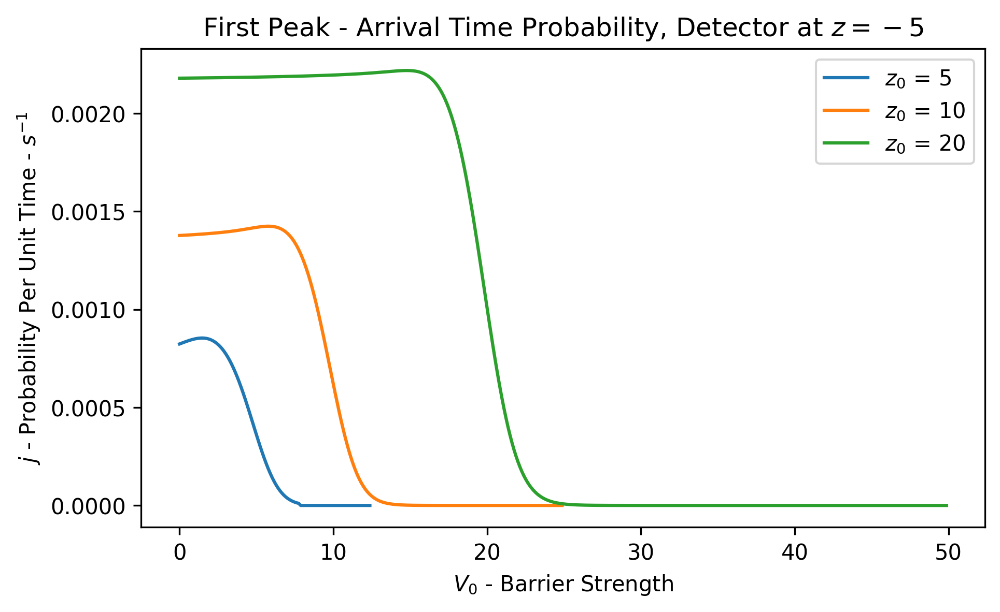

In [237]:
first_peak_values = {}

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():

	first_peak_values[z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		first_peak_idx, first_peak_val = find_first_peak(j)
		first_peak_values[z0].append([ii*0.125, first_peak_val])

fix, ax = plt.subplots(1,1, figsize=(7,4))
fix.dpi = 300

for z0, y_values in first_peak_values.items():
	x,y = zip(*y_values)
	im = ax.plot(x, y, label=f"$z_0$ = {z0}")

ax.set_title("First Peak - Arrival Time Probability, Detector at $z=-5$")
ax.legend()
ax.set_xlabel("$V_0$ - Barrier Strength")
ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
# Move plt.show() outside the loop
plt.show()

Now for time

In [93]:
dt = 0.001

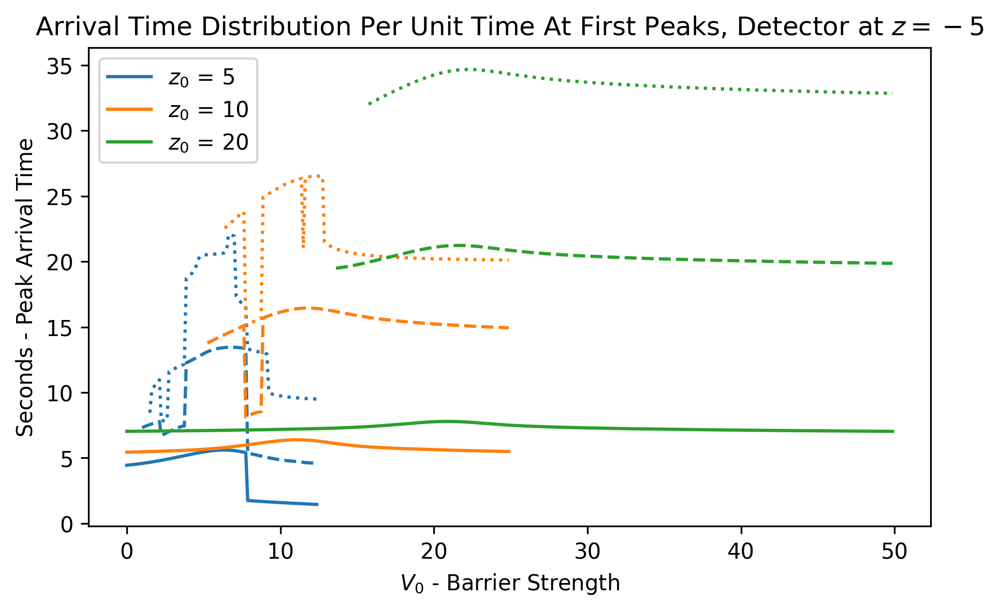

In [ ]:
first_peak_time_values = {}
second_peak_time_values = {}
third_peak_time_values = {}

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():

	first_peak_time_values[z0] = []
	second_peak_time_values[z0] = []
	third_peak_time_values[z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		first_peak_idx, first_peak_val = find_first_peak(j)
		second_peak_idx, second_peak_val = find_first_peak(j, 1)
		third_peak_idx, third_peak_val = find_first_peak(j, 2)

		if first_peak_idx is not None:
			first_peak_time_values[z0].append([ii*0.125, first_peak_idx*dt])

		if second_peak_idx is not None:
			second_peak_time_values[z0].append([ii*0.125, second_peak_idx*dt])

		if third_peak_idx is not None:
			third_peak_time_values[z0].append([ii*0.125, third_peak_idx*dt])

fix, ax = plt.subplots(1,1, figsize=(7,4))
fix.dpi = 300

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for i, (z0, y_values) in enumerate(first_peak_time_values.items()):
	x, y = zip(*y_values)
	x2, y2 = zip(*second_peak_time_values[z0])

	color = colors[i % len(colors)]  # Cycle through colors if we have more z0 values than colors
	ax.plot(x, y, color=color, label=f"$z_0$ = {z0}")
	ax.plot(x2, y2, color=color, linestyle='--')
	
	if (len(third_peak_time_values[z0]) > 0):
		x3, y3 = zip(*third_peak_time_values[z0])
		ax.plot(x3, y3, color=color, linestyle='dotted')

ax.set_title("Arrival Time Distribution Per Unit Time At First Peaks, Detector at $z=-5$")
ax.legend()
ax.set_xlabel("$V_0$ - Barrier Strength")
ax.set_ylabel("Seconds - Peak Arrival Time")
plt.show()

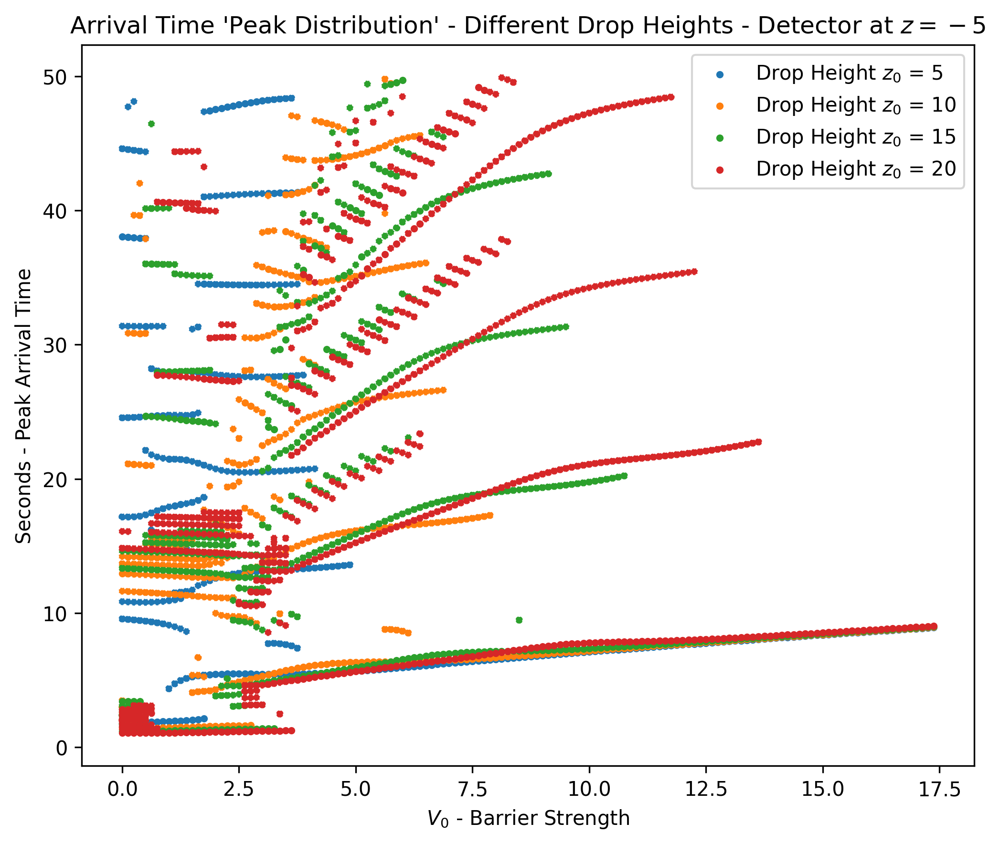

In [534]:
peaks = 10

# Dictionary to store peak time values for all 7 peaks
peak_time_values = {i: {} for i in range(1, peaks)}  # 1 through 7 peaks

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():
	# Initialize lists for each peak
	for peak_num in range(1, peaks):
		peak_time_values[peak_num][z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		# Find all 7 peaks
		for peak_num in range(1, peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num - 1)  # peak_num - 1 because find_first_peak uses 0-based indexing
			
			if peak_idx is not None:
				peak_time_values[peak_num][z0].append([ii*0.125, peak_idx*dt])

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(7, 6))  # Slightly larger figure to accommodate more lines
fig.dpi = 300

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Define line styles for different peaks
line_styles = ['-', '--', ':', '-.', '--', ':', '-.']  # Different styles for each peak

# Plot each z0 value
for i, (z0, _) in enumerate(peak_time_values[1].items()):
	color = colors[i % len(colors)]  # Cycle through colors for different z0 values
	
	# Plot all 7 peaks for this z0
	for peak_num in range(1, peaks):
		
		label = f"Drop Height $z_0$ = {z0}" if peak_num == 1 else None

		if len(peak_time_values[peak_num][z0]) > 0:
			x, y = zip(*peak_time_values[peak_num][z0])
			ax.scatter(
				x, y,
				color=color,
				linestyle=line_styles[(peak_num - 1) % (len(line_styles)-1)],
				linewidths=0.5,
				s=10,  # <-- This makes the dots small. Try values like 5, 10, or 20.
				label=label
			)

ax.set_title("Arrival Time 'Peak Distribution' - Different Drop Heights - Detector at $z=-5$")
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside to prevent overlap
ax.legend(loc='upper right')  # Move legend outside to prevent overlap
ax.set_xlabel("$V_0$ - Barrier Strength")
ax.set_ylabel("Seconds - Peak Arrival Time")
plt.tight_layout()  # Adjust layout to prevent label cutoff
plt.show()

Room for testing

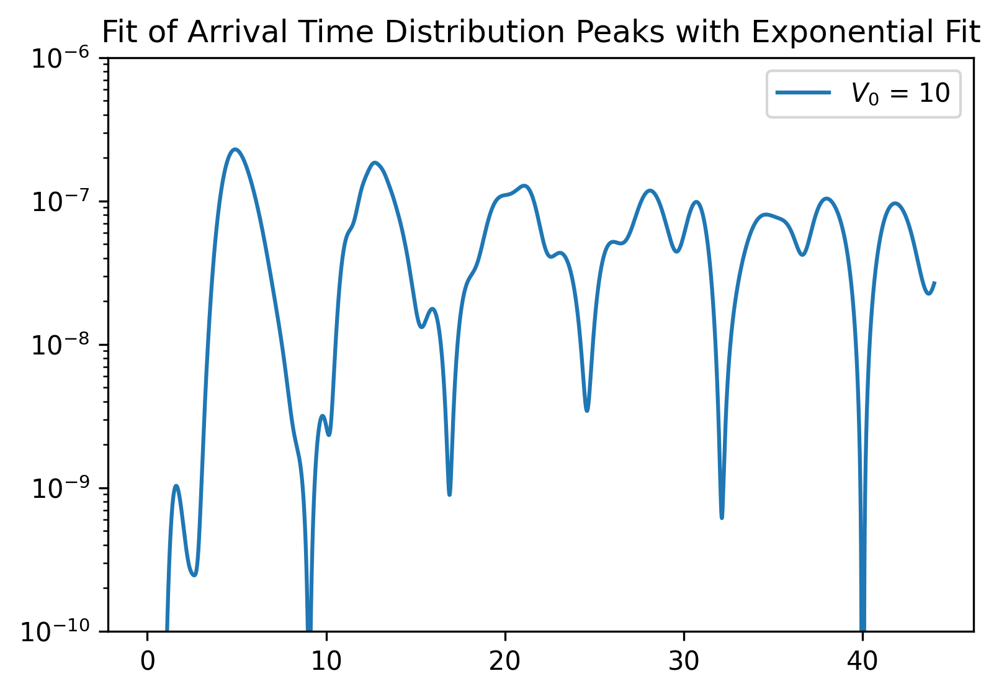

In [126]:
# Simple single use
fix, ax = plt.subplots(1,1, figsize=(6,4))
fix.dpi = 300

# use [5, 10, 20], and then for different values of v0
j = j_results_donna[5][-1]

im = ax.plot(t_vals[:], j[:], label=f"$V_0$ = {10}")

ax.set_yscale('log')
ax.set_ylim(1e-10, 1e-6)

ax.set_title("Fit of Arrival Time Distribution Peaks with Exponential Fit")
ax.legend()

	
plt.show()

With second peak values

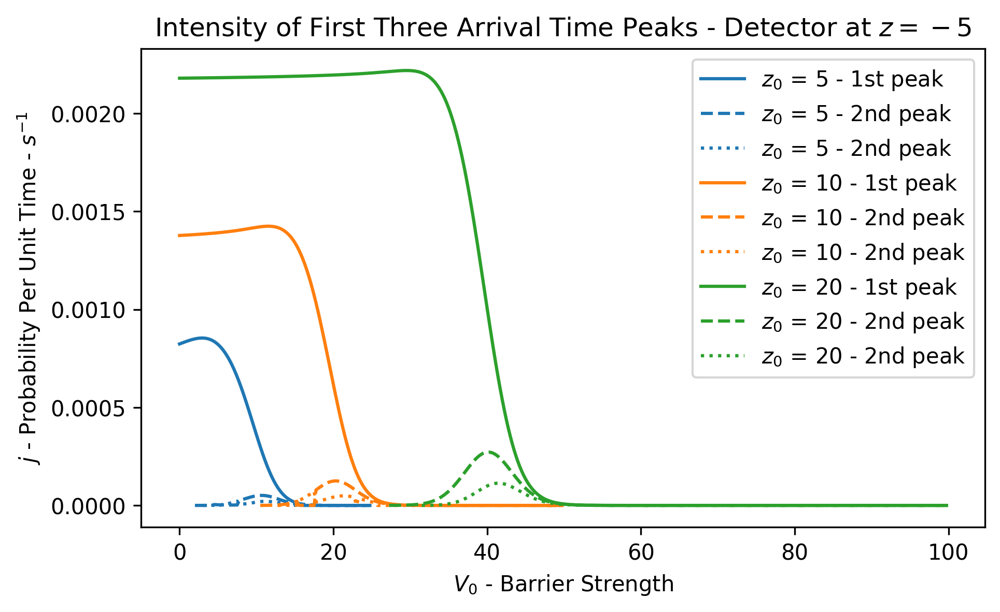

In [ ]:
first_peak_values = {}
second_peak_values = {}
third_peak_values = {}

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():

	first_peak_values[z0] = []
	second_peak_values[z0] = []
	third_peak_values[z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		first_peak_idx, first_peak_val = find_first_peak(j, 0)
		sec_peak_idx, sec_peak_val = find_first_peak(j, 1)
		third_peak_idx, third_peak_val = find_first_peak(j, 2)

		first_peak_values[z0].append([ii*0.25, first_peak_val])
		second_peak_values[z0].append([ii*0.25, sec_peak_val])
		third_peak_values[z0].append([ii*0.25, third_peak_val])

fix, ax = plt.subplots(1,1, figsize=(7,4))
fix.dpi = 300

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for i, (z0, y_values) in enumerate(first_peak_values.items()):
	x, y = zip(*y_values)
	x2, y2 = zip(*second_peak_values[z0])
	color = colors[i % len(colors)]  # Cycle through colors if we have more z0 values than colors
	ax.plot(x, y, color=color, label=f"$z_0$ = {z0} - 1st peak")
	ax.plot(x2, y2, color=color, linestyle='--', label=f"$z_0$ = {z0} - 2nd peak")

	if (len(third_peak_values[z0]) > 0):
		x3, y3 = zip(*third_peak_values[z0])
		ax.plot(x3, y3, color=color, linestyle='dotted', label=f"$z_0$ = {z0} - 2nd peak")

ax.set_title("Intensity of First Three Arrival Time Peaks - Detector at $z=-5$")
ax.legend()
ax.set_xlabel("$V_0$ - Barrier Strength")
ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
plt.show()

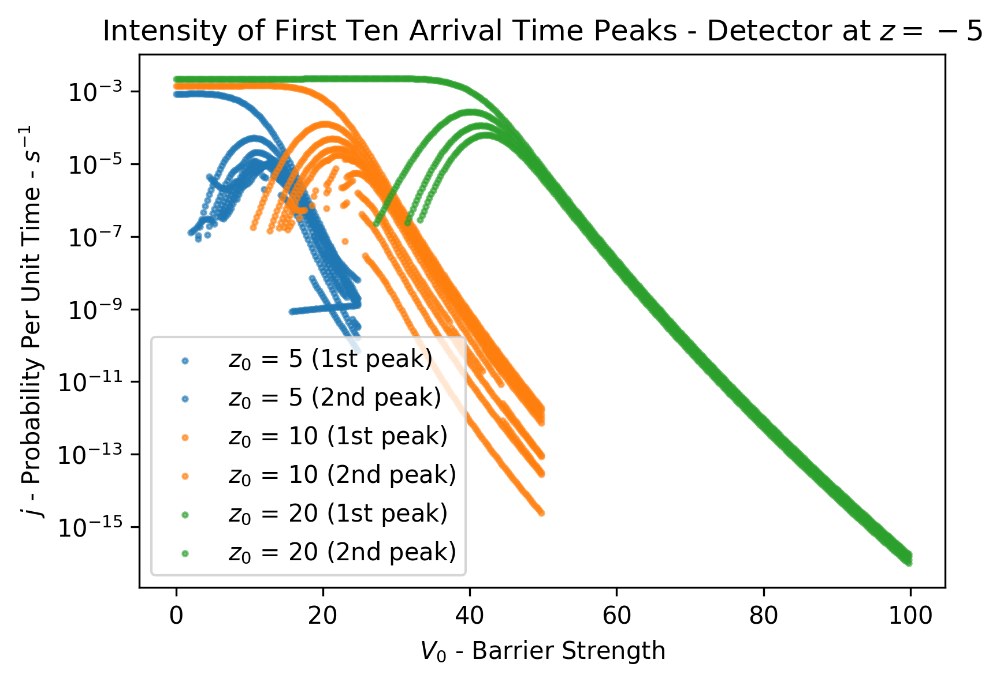

In [233]:
num_peaks = 10
peak_values = [{} for _ in range(num_peaks)]

# Collect peak values for each z0 and each peak
for z0, j_for_v0_values in j_results_donna.items():
	for peak_dict in peak_values:
		peak_dict[z0] = []

	for ii, j in enumerate(j_for_v0_values):
		for peak_num in range(num_peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num)
			peak_values[peak_num][z0].append([ii * 0.25, peak_val])

fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for i, z0 in enumerate(j_results_donna.keys()):
	
	# if z0 == 20:
	#     continue
	
	color = colors[i % len(colors)]
	for peak_num in range(num_peaks):
		x, y = zip(*peak_values[peak_num][z0])
		# Only label the first and second peaks
		label = None
		if peak_num == 0:
			label = f"$z_0$ = {z0} (1st peak)"
		elif peak_num == 1:
			label = f"$z_0$ = {z0} (2nd peak)"
		ax.scatter(x, y, color=color, s=4, label=label, alpha=0.6)

ax.set_title("Intensity of First Ten Arrival Time Peaks - Detector at $z=-5$")
ax.legend()
ax.set_xlabel("$V_0$ - Barrier Strength")
ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
ax.set_yscale('log')
plt.show()

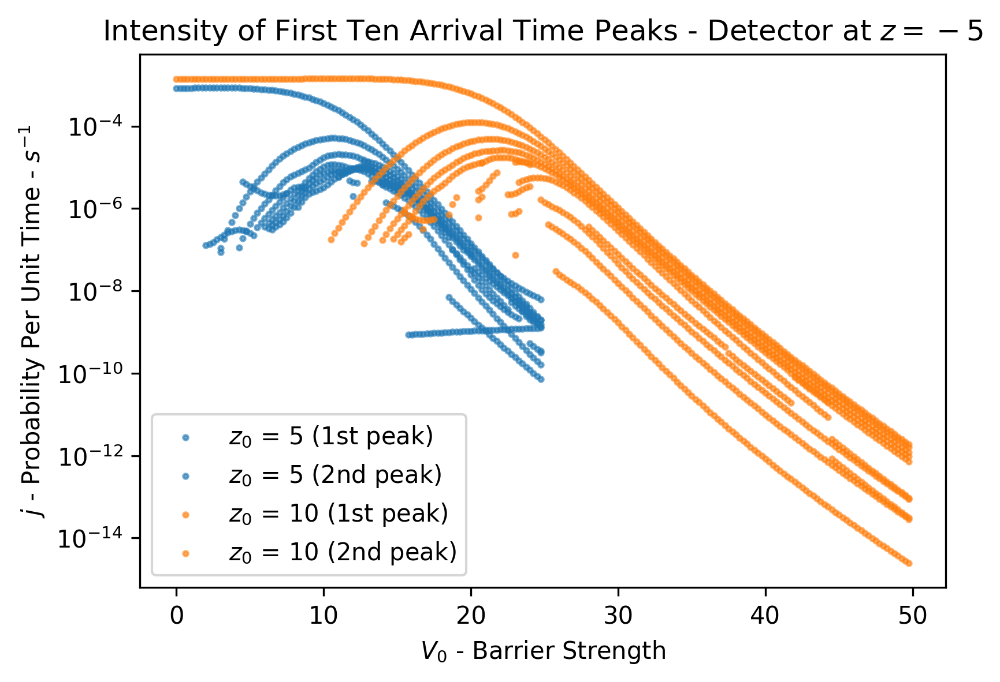

In [ ]:
num_peaks = 10
peak_values = [{} for _ in range(num_peaks)]

# Collect peak values for each z0 and each peak
for z0, j_for_v0_values in j_results_donna.items():
	for peak_dict in peak_values:
		peak_dict[z0] = []

	for ii, j in enumerate(j_for_v0_values):
		for peak_num in range(num_peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num)
			peak_values[peak_num][z0].append([ii * 0.25, peak_val])

fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for i, z0 in enumerate(j_results_donna.keys()):
	
	if z0 == 20:
		continue
	
	color = colors[i % len(colors)]
	for peak_num in range(num_peaks):
		x, y = zip(*peak_values[peak_num][z0])
		# Only label the first and second peaks
		label = None
		if peak_num == 0:
			label = f"$z_0$ = {z0} (1st peak)"
		elif peak_num == 1:
			label = f"$z_0$ = {z0} (2nd peak)"
		ax.scatter(x, y, color=color, s=4, label=label, alpha=0.6)

ax.set_title("Intensity of First Ten Arrival Time Peaks - Detector at $z=-5$")
ax.legend()
ax.set_xlabel("$V_0$ - Barrier Strength")
ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
ax.set_yscale('log')
plt.show()

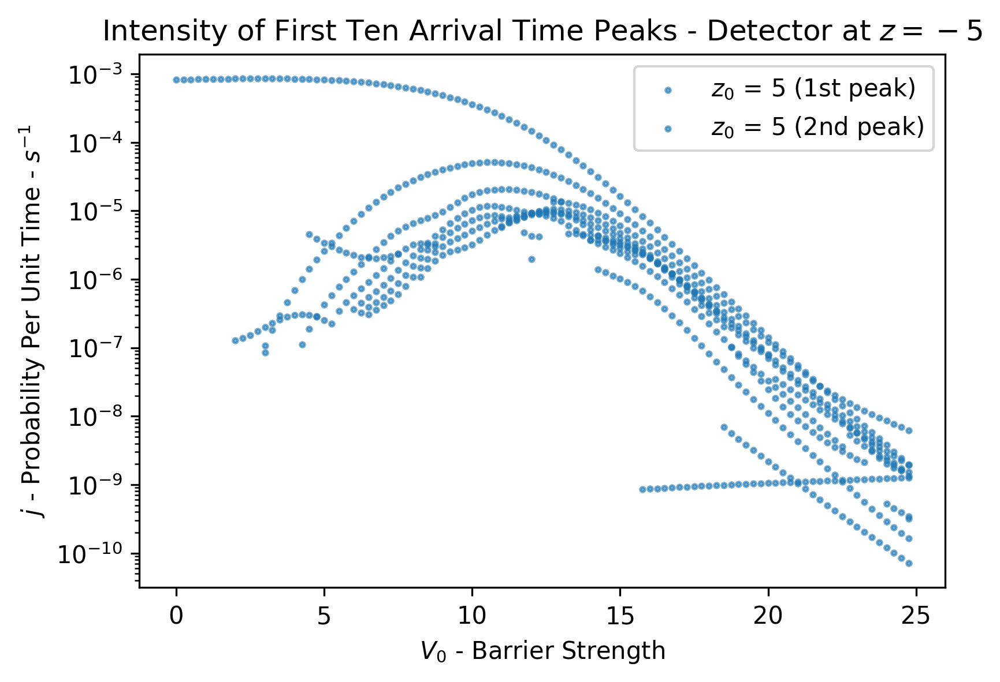

In [236]:
num_peaks = 10
peak_values = [{} for _ in range(num_peaks)]

# Collect peak values for each z0 and each peak
for z0, j_for_v0_values in j_results_donna.items():
	for peak_dict in peak_values:
		peak_dict[z0] = []

	for ii, j in enumerate(j_for_v0_values):
		for peak_num in range(num_peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num)
			peak_values[peak_num][z0].append([ii * 0.25, peak_val])

fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for i, z0 in enumerate(j_results_donna.keys()):
	
	if z0 == 20 or z0 == 10:
		continue
	
	color = colors[i % len(colors)]
	for peak_num in range(num_peaks):
		x, y = zip(*peak_values[peak_num][z0])
		# Only label the first and second peaks
		label = None
		if peak_num == 0:
			label = f"$z_0$ = {z0} (1st peak)"
		elif peak_num == 1:
			label = f"$z_0$ = {z0} (2nd peak)"
		ax.scatter(x, y, color=color, s=4, label=label, alpha=0.6)

ax.set_title("Intensity of First Ten Arrival Time Peaks - Detector at $z=-5$")
ax.legend()
ax.set_xlabel("$V_0$ - Barrier Strength")
ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
ax.set_yscale('log')
plt.show()

z0=5 1st peak valid y: [8.23730718e-04 8.27464269e-04 8.31154822e-04 8.34758875e-04
 8.38229018e-04 8.41513298e-04 8.44554504e-04 8.47291571e-04
 8.49659053e-04 8.51587473e-04 8.53003893e-04 8.53831937e-04
 8.53992495e-04 8.53403653e-04 8.51982429e-04 8.49644112e-04
 8.46304892e-04 8.41879986e-04 8.36287046e-04 8.29446496e-04
 8.21281590e-04 8.11721405e-04 8.00700481e-04 7.88161745e-04
 7.74056878e-04 7.58349316e-04 7.41015131e-04 7.22044837e-04
 7.01446794e-04 6.79247573e-04 6.55495225e-04 6.30260796e-04
 6.03639415e-04 5.75751690e-04 5.46744498e-04 5.16790104e-04
 4.86085210e-04 4.54848618e-04 4.23317440e-04 3.91742785e-04
 3.60384154e-04 3.29502838e-04 2.99354966e-04 2.70184253e-04
 2.42215126e-04 2.15645964e-04 1.90643941e-04 1.67340750e-04
 1.45829847e-04 1.26165704e-04 1.08364421e-04 9.24059177e-05
 7.82376782e-05 6.57793203e-05 5.49279490e-05 4.55638619e-05
 3.75562902e-05 3.07687467e-05 2.50639239e-05 2.03077770e-05
 1.63728589e-05 1.31407449e-05 1.05036371e-05 8.56293802e-10
 

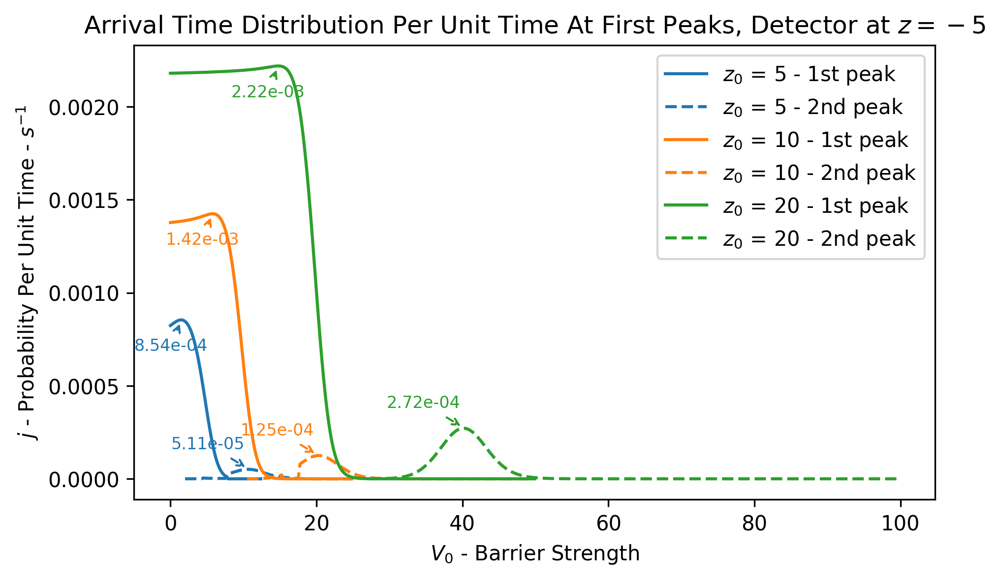

In [244]:
import numpy as np

fix, ax = plt.subplots(1,1, figsize=(7,4))
fix.dpi = 300


# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for i, (z0, y_values) in enumerate(first_peak_values.items()):
	x, y = zip(*y_values)
	x2, y2 = zip(*second_peak_values[z0])
	color = colors[i % len(colors)]

	# Plot the lines
	ax.plot(x, y, color=color, label=f"$z_0$ = {z0} - 1st peak")
	ax.plot(x2, y2, color=color, linestyle='--', label=f"$z_0$ = {z0} - 2nd peak")

	# --- 1st peak: filter out None and nan values ---
	y_arr = np.array([v if v is not None else np.nan for v in y], dtype=np.float64)
	x_arr = np.array([v if v is not None else np.nan for v in x], dtype=np.float64)
	valid_mask_1 = ~np.isnan(y_arr)
	print(f"z0={z0} 1st peak valid y:", y_arr[valid_mask_1])
	if np.any(valid_mask_1):
		max_idx_1 = np.argmax(y_arr[valid_mask_1])
		print(f"z0={z0} 1st peak max:", y_arr[valid_mask_1][max_idx_1])
		ax.annotate(
			f"{y_arr[valid_mask_1][max_idx_1]:.2e}",
			xy=(x_arr[valid_mask_1][max_idx_1], y_arr[valid_mask_1][max_idx_1]),
			xytext=(-5, -15),
			textcoords='offset points',
			ha='center',
			color=color,
			fontsize=8,
			arrowprops=dict(arrowstyle='->', color=color, lw=1)
		)

	# --- 2nd peak: filter out None and nan values ---
	y2_arr = np.array([v if v is not None else np.nan for v in y2], dtype=np.float64)
	x2_arr = np.array([v if v is not None else np.nan for v in x2], dtype=np.float64)
	valid_mask_2 = ~np.isnan(y2_arr)
	print(f"z0={z0} 2nd peak valid y:", y2_arr[valid_mask_2])
	if np.any(valid_mask_2):
		max_idx_2 = np.argmax(y2_arr[valid_mask_2])
		print(f"z0={z0} 2nd peak max:", y2_arr[valid_mask_2][max_idx_2])
		ax.annotate(
			f"{y2_arr[valid_mask_2][max_idx_2]:.2e}",
			xy=(x2_arr[valid_mask_2][max_idx_2], y2_arr[valid_mask_2][max_idx_2]),
			xytext=(-20, 10),
			textcoords='offset points',
			ha='center',
			color=color,
			fontsize=8,
			arrowprops=dict(arrowstyle='->', color=color, lw=1, linestyle='--')
		)
		
ax.set_title("Arrival Time Distribution Per Unit Time At First Peaks, Detector at $z=-5$")
ax.legend()
ax.set_xlabel("$V_0$ - Barrier Strength")
ax.set_ylabel("$j$ - Probability Per Unit Time - $s^{-1}$")
plt.show()

## Characterization of $\lambda$ in $e^{- \lambda t}$

In [515]:
import numpy as np
from scipy.optimize import curve_fit

# def exponential_decay(t, a, b, lambda_coeff):
		# return a * np.exp(-b*np.exp(-lambda_coeff * t))

def exponential_decay(t, a, lambda_coeff):
	return a * np.exp(-lambda_coeff * t)

def fit_exponential_to_peaks(t_vals, array, threshold=0.0001):
	"""
	Fit an exponential decay through the peaks of an array.
	
	Parameters:
	-----------
	t_vals : numpy.ndarray
		Time values array
	array : numpy.ndarray
		The input array to analyze
	threshold : float, optional
		Minimum height difference to consider a point as a peak (default: 0.1)
		
	Returns:
	--------
	tuple
		(lambda_coeff, amplitude, peak_indices, peak_values)
		lambda_coeff: decay rate
		amplitude: initial amplitude
		peak_indices: indices of peaks used for fitting
		peak_values: values of peaks used for fitting
	"""
	
	
	# Find all peaks
	from scipy.signal import find_peaks

	tryout_1 = np.max(array)*0.0001

	peak_indices, properties = find_peaks(array, height=tryout_1)
	if len(peak_indices) < 3:
		peak_indices, properties = find_peaks(array, height=tryout_1/10)
		if len(peak_indices) < 3:
			peak_indices, properties = find_peaks(array, height=tryout_1/100)
			if len(peak_indices) < 3:
				peak_indices, properties = find_peaks(array, height=tryout_1/1000)
				if len(peak_indices) < 3:
					peak_indices, properties = find_peaks(array, height=tryout_1/10000)
					if len(peak_indices) < 3:
						raise ValueError("Not enough peaks found for fitting")

	peak_times = t_vals[peak_indices]
	peak_values = array[peak_indices]

	try:
		popt, pcov = curve_fit(exponential_decay, peak_times, peak_values, 
							  p0=[max(peak_values), 1.0])  # Initial guess
		amplitude, lambda_coeff = popt

		# Calculate fitted values and MSE
		fitted = exponential_decay(peak_times, amplitude, lambda_coeff)
		mse = np.mean((peak_values - fitted) ** 2)

		return lambda_coeff, amplitude, peak_indices, peak_values, mse

	except RuntimeError:
		raise ValueError("Could not fit exponential to peaks")

In [246]:
dt = 0.001

In [249]:
j.shape

(50000,)

In [250]:
t_vals.shape

(44000,)

/var/folders/yj/gnbff_r55s7fw6ylhj7q526r0000gn/T/ipykernel_3217/2946661798.py:8: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-lambda_coeff * t)


Decay rate (λ): 0.018
Amplitude: 0.000


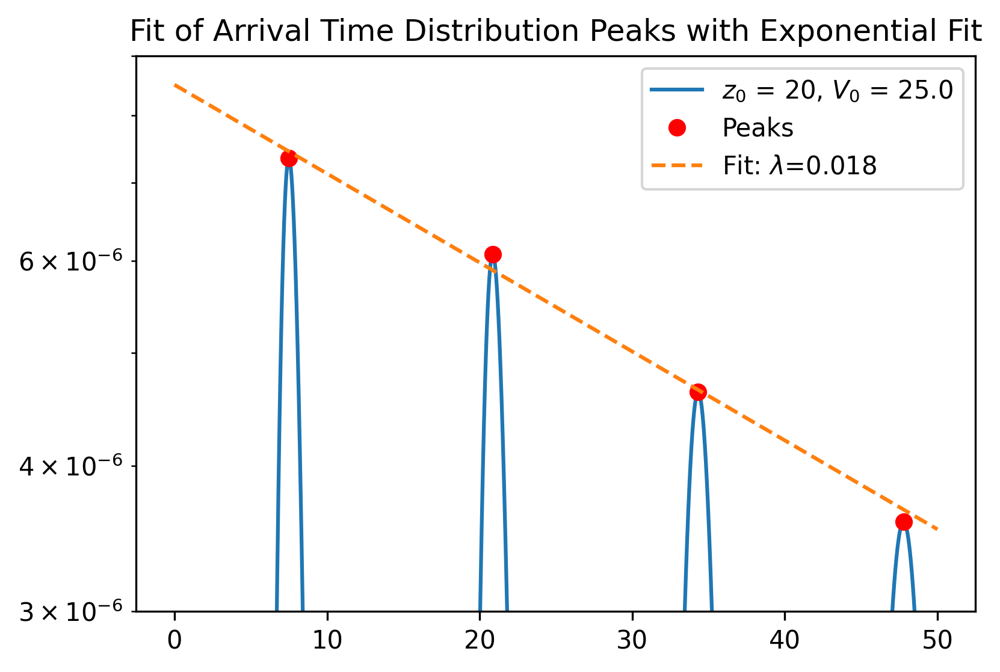

In [526]:
# Simple single use
fix, ax = plt.subplots(1,1, figsize=(6,4))
fix.dpi = 300

# use [5, 10, 20], and then for different values of v0
v0 = 20
j = j_results_donna[v0][200]

im = ax.plot(t_vals[:], j[:], label=f"$z_0$ = {v0}, $V_0$ = {200*0.125}")

# Fit exponential to peaks
try:
	lambda_coeff, amplitude, peak_indices, peak_values, mse = fit_exponential_to_peaks(t_vals, j, threshold=0.000000001)
	
	# Plot the peaks
	ax.plot(t_vals[peak_indices], peak_values, 'ro', label='Peaks')
	
	# Plot the fitted exponential
	t_fit = np.linspace(min(t_vals), max(t_vals), 100)
	# y_fit = amplitude * np.exp(-lambda_coeff * t_fit)
	y_fit = exponential_decay(t_fit, amplitude, lambda_coeff)
	# y_fit = exponential_decay(t_fit, a, b, c, lambda_coeff)

	ax.plot(t_fit, y_fit, '--', label=f'Fit: $\lambda$={lambda_coeff:.3f}')
	
	print(f"Decay rate (λ): {lambda_coeff:.3f}")
	print(f"Amplitude: {amplitude:.3f}")
	
except ValueError as e:
	print(f"Could not fit exponential: {e}")

	# break

ax.set_title("Fit of Arrival Time Distribution Peaks with Exponential Fit")
ax.legend()
ax.set_yscale('log')
ax.set_ylim(3e-6, 9e-6)
	
plt.show()

Characterize Lambda for three z0 and the different potentials

/var/folders/yj/gnbff_r55s7fw6ylhj7q526r0000gn/T/ipykernel_3217/2946661798.py:8: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-lambda_coeff * t)


ValueError: not enough values to unpack (expected 2, got 0)

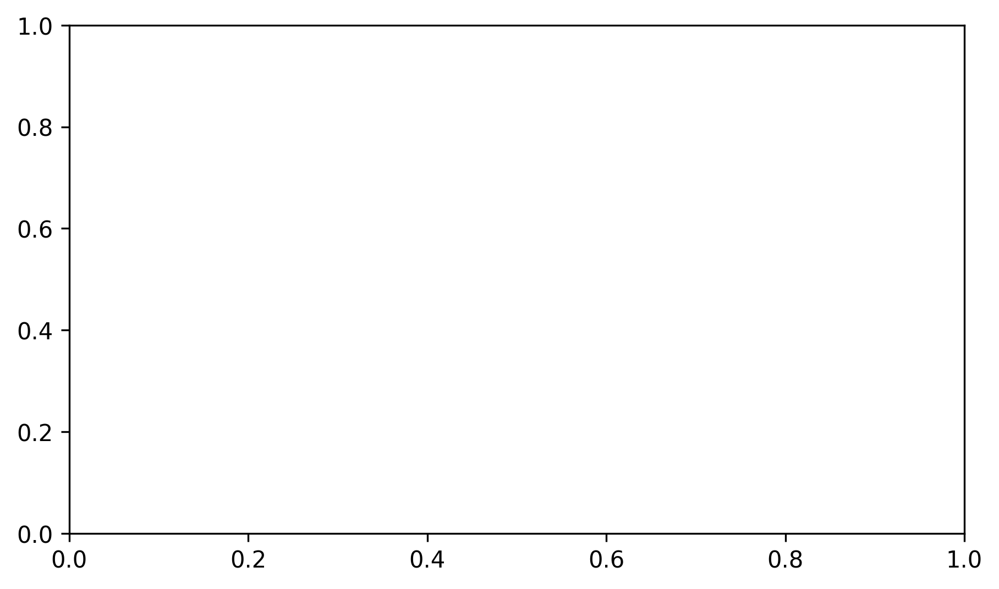

In [519]:
lambda_values = {}

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():

	lambda_values[z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):

		try:
			lambda_coeff, amplitude, peak_indices, peak_values = fit_exponential_to_peaks(t_vals, j, threshold=0.0001)
			lambda_values[z0].append([ii*0.125, lambda_coeff])
		except ValueError as e:
			pass

fix, ax = plt.subplots(1,1, figsize=(7,4))
fix.dpi = 300

for z0, y_values in lambda_values.items():
	x,y = zip(*y_values)
	im = ax.scatter(x, y, label=f"$z_0$ = {z0}")

ax.set_title("Fitted Decay Rate $\lambda$ of Arrival Time Peaks (Per Unit Area), Detector at $z=-5$")
ax.legend()
ax.set_xlabel("$V_0$ - Barrier Strength")
ax.set_ylabel("Decay Rate - $\lambda$")
# Move plt.show() outside the loop
plt.show()

/var/folders/yj/gnbff_r55s7fw6ylhj7q526r0000gn/T/ipykernel_3217/77924577.py:8: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-lambda_coeff * t)


ValueError: not enough values to unpack (expected 2, got 0)

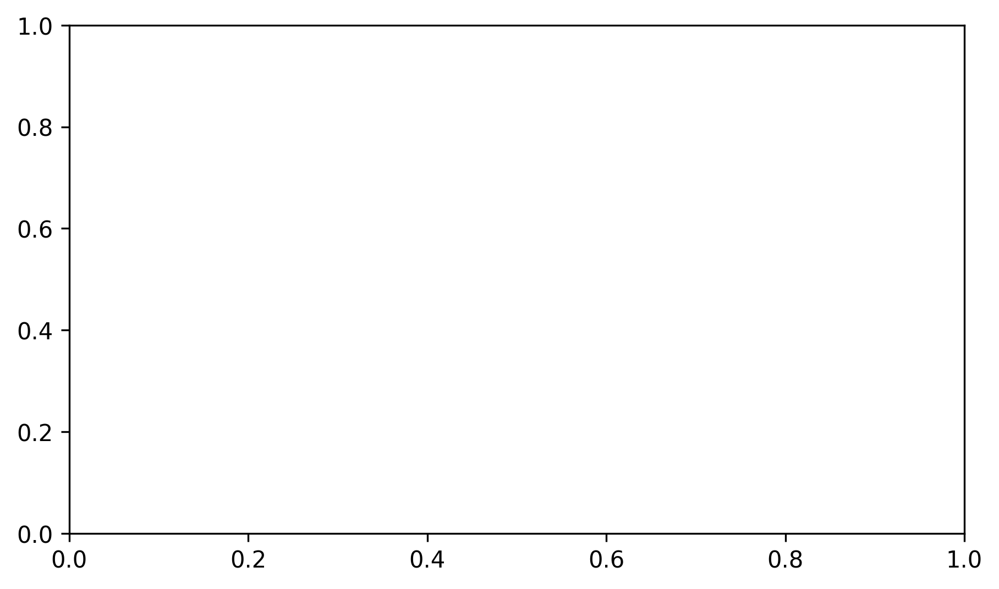

In [502]:
lambda_values = {}

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():

	lambda_values[z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):

		try:
			lambda_coeff, amplitude, peak_indices, peak_values = fit_exponential_to_peaks(t_vals, j, threshold=0.0001)
			lambda_values[z0].append([ii*0.125, lambda_coeff])
		except ValueError as e:
			pass


fix, ax = plt.subplots(1,1, figsize=(7,4))
fix.dpi = 300

for z0, y_values in lambda_values.items():

	# if z0 == 5:
	# 	continue
	x,y = zip(*y_values)
	im = ax.scatter(x, 1/np.array(y), label=f"$z_0$ = {z0}", s=4, alpha=0.6)

ax.set_title("Plotting $\\tau = \\frac{1}{\lambda}$ of fitted exponential through arrival time peaks")
ax.legend()
ax.set_xlabel("$z_0$ - Drop Height")
ax.set_ylabel("Seconds - $s$")

ax.set_yscale('log')

# Move plt.show() outside the loop
plt.show()

/var/folders/yj/gnbff_r55s7fw6ylhj7q526r0000gn/T/ipykernel_3217/2946661798.py:8: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-lambda_coeff * t)
/var/folders/yj/gnbff_r55s7fw6ylhj7q526r0000gn/T/ipykernel_3217/2946661798.py:55: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(exponential_decay, peak_times, peak_values,


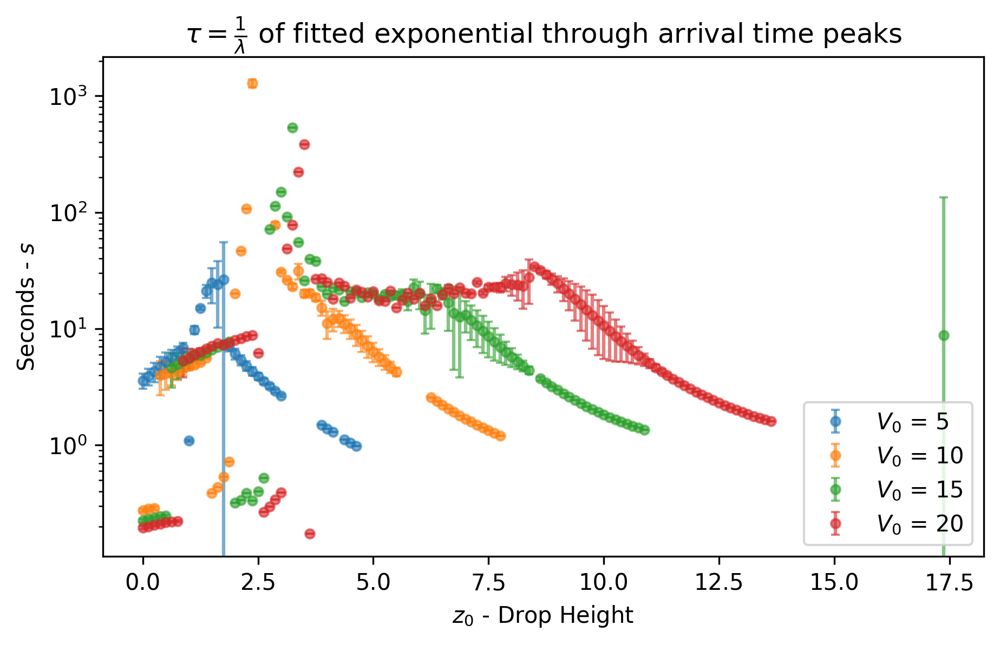

In [533]:
lambda_values = {}
mse_values = {}

for z0, j_for_v0_values in j_results_donna.items():
	lambda_values[z0] = []
	mse_values[z0] = []

	for ii, j in enumerate(j_for_v0_values):
		try:
			lambda_coeff, amplitude, peak_indices, peak_values, mse = fit_exponential_to_peaks(t_vals, j, threshold=0.0001)
			lambda_values[z0].append([ii*0.125, lambda_coeff])
			mse_values[z0].append(mse)
		except ValueError as e:
			pass
		
fix, ax = plt.subplots(1,1, figsize=(7,4))
fix.dpi = 300

for z0, y_values in lambda_values.items():
	x, y = zip(*y_values)
	mses = mse_values[z0]
	y = np.array(y)
	mses = np.array(mses)

	# Error propagation for 1/lambda
	yerr = np.sqrt(mses) / (y**2) * 3000
	ax.errorbar(x, 1/y, yerr=yerr, fmt='o', label=f"$V_0$ = {z0}", markersize=4, alpha=0.6, capsize=2)

ax.set_title("$\\tau = \\frac{1}{\lambda}$ of fitted exponential through arrival time peaks")
ax.legend()
ax.set_xlabel("$z_0$ - Drop Height")
ax.set_ylabel("Seconds - $s$")
ax.set_yscale('log')
plt.show()

## Das Paper Comparison

## Semi-Classical Solution Comparison

In [211]:
import matplotlib.pyplot as plt
# for reloading of modules
import importlib
from helpers import daspaper

def reload_modules():	
	importlib.reload(daspaper)

reload_modules()
from helpers.daspaper import *

eta: 2000.0, n: 2


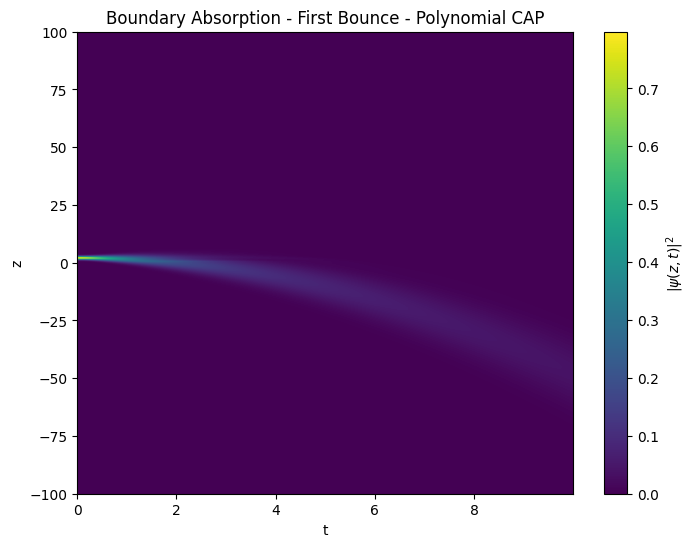

Text(0.5, 1.0, 'Arrival Time Distribution')

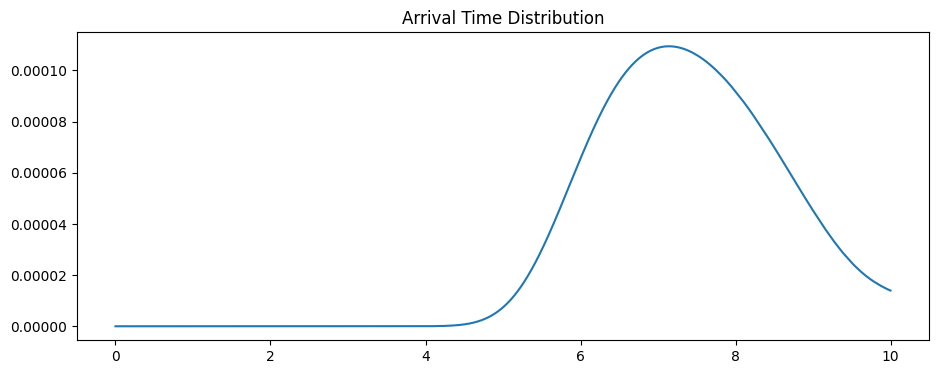

In [212]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Example usage: delta barrier
barrier_params_delta = {'z0': 0.0, 'alpha': 0.1}
params = {
	"n_steps":10000,
	"dt":0.001,
	"x_min":-100, "x_max":100, "Nx":512*2*2,

	#
	"barrier_type": 'delta',
	"barrier_params": barrier_params_delta,

	# apply_parabolic_dwell=False,
	# strength=100,
	# z_dwell_start=-10,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"sigma0_packet": 0.5,
	"z0_packet": 2.0,
	"p0_packet": 0.0
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

# Now plot the spacetime density
plot_spacetime(prob_arr[:][:], z_array, t_vals[:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

J = - (hbar / (m)) * np.imag(
		np.conj(psi_history) * np.gradient(psi_history, axis=0)
	)

dz = z_array[1]-z_array[0]
position = L = -25

JSlice = J[:, int(params["Nx"]/2+position/dz)]
fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(t_vals[:], JSlice[:])
ax.set_title("Arrival Time Distribution")

In [213]:
params['sigma0_packet'], params['z0_packet'], L, barrier_params_delta['alpha']

(0.5, 2.0, -25, 0.1)

In [214]:
P_vals = [P_gamma_of_tau_2(t, params['sigma0_packet'], params['z0_packet'], -L, barrier_params_delta['alpha']) for t in t_vals]

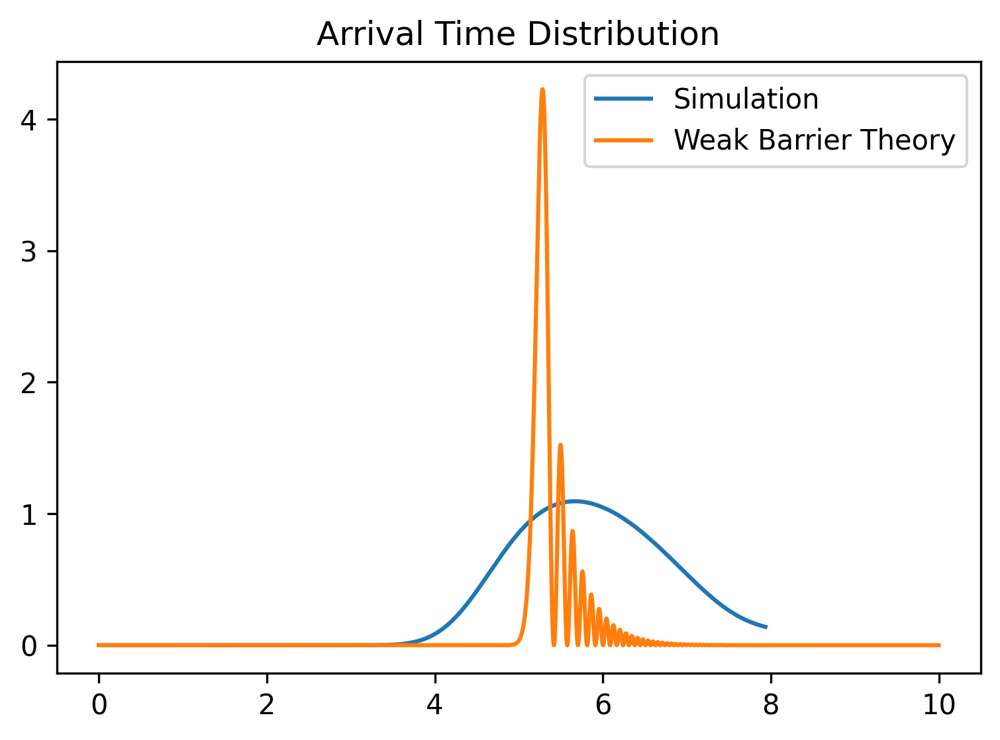

In [215]:
l_0 = (1/2)**(1/3)

JSlice = J[:, int(params["Nx"]/2+position/dz)]
fix, ax = plt.subplots(1,1, figsize=(6,4))
fix.dpi = 300
im = ax.plot(t_vals[:]*l_0, JSlice[:]*1e4, label="Simulation")
ax.set_title("Arrival Time Distribution")

ax.plot(t_vals[:], P_vals[:], label="Weak Barrier Theory")

ax.legend()

# Absorption Mask Testing

## Polynomial Absorption

In [5]:
200 / (512*2*2) / 2

0.048828125

eta: 2000.0, n: 2


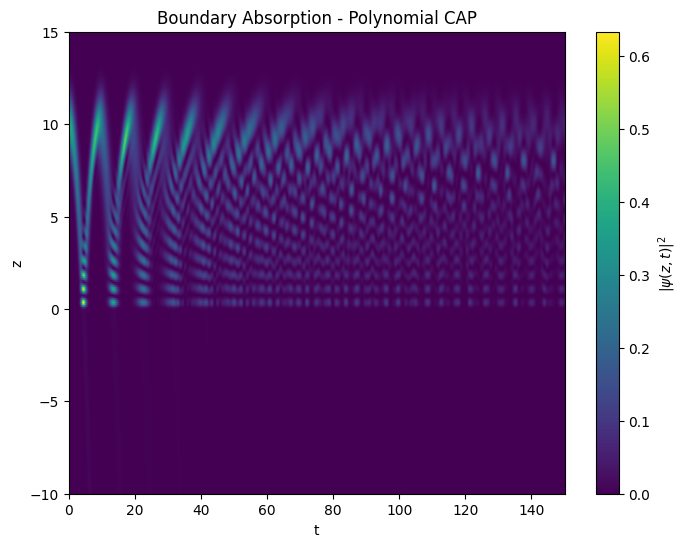

Text(0.5, 1.0, 'Arrival Time Distribution')

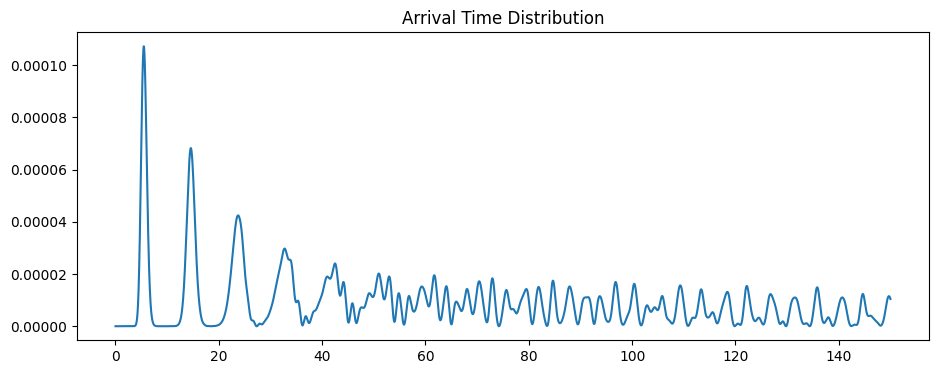

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Example usage: delta barrier
barrier_params_delta = {'z0': 0.0, 'alpha': 10}
params = {
	"n_steps":160000,
	"dt":0.001,
	"x_min":-100, "x_max":100, "Nx":512*2*2,

	# This is amazing
	"barrier_type": 'delta',
	"barrier_params": barrier_params_delta,

	# apply_parabolic_dwell=False,
	# strength=100,
	# z_dwell_start=-10,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	"g": 1,

	# initial wave function
	"sigma0_packet": 1,
	"z0_packet": 10.0,
	"p0_packet": 0.0
}

# simulate
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

# Now plot the spacetime density
plot_spacetime(prob_arr[:][:-10000], z_array, t_vals[:-10000], title="Boundary Absorption - Polynomial CAP", log_scale=True, z_min=-10, z_max=15)

J = - (hbar / (m)) * np.imag(
		np.conj(psi_history) * np.gradient(psi_history, axis=0)
	)

dz = z_array[1]-z_array[0]
position = L = -5

JSlice = J[:, int(params["Nx"]/2+position/dz)]
fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(t_vals[:-10000], JSlice[:-10000])
ax.set_title("Arrival Time Distribution")

In [ ]:
# Now plot the spacetime density
plot_spacetime(prob_arr[:][:-10000], z_array, t_vals[:-10000], title="Boundary Absorption - Polynomial CAP", log_scale=True, z_min=-10, z_max=15)

J = - (hbar / (m)) * np.imag(
		np.conj(psi_history) * np.gradient(psi_history, axis=0)
	)

dz = z_array[1]-z_array[0]
position = L = -5

JSlice = J[:, int(params["Nx"]/2+position/dz)]
fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(t_vals[:-10000], JSlice[:-10000])
ax.set_title("Arrival Time Distribution")

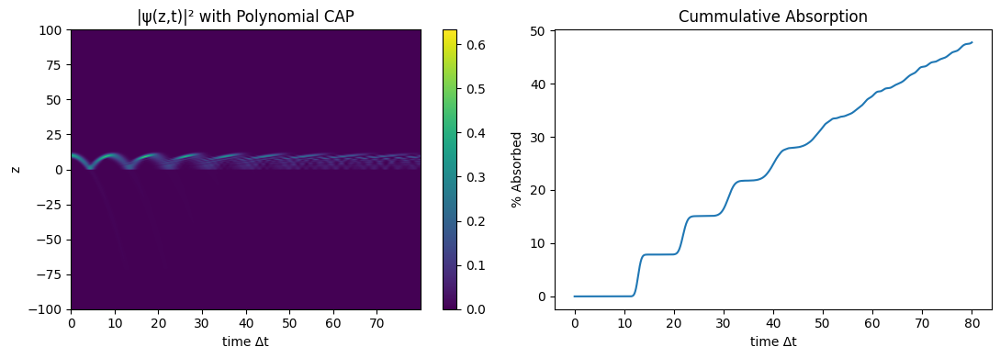

In [380]:
# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with Polynomial CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[:], (loss[:]) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Absorbed")
ax[1].set_title("Cummulative Absorption")
plt.tight_layout()
plt.show()

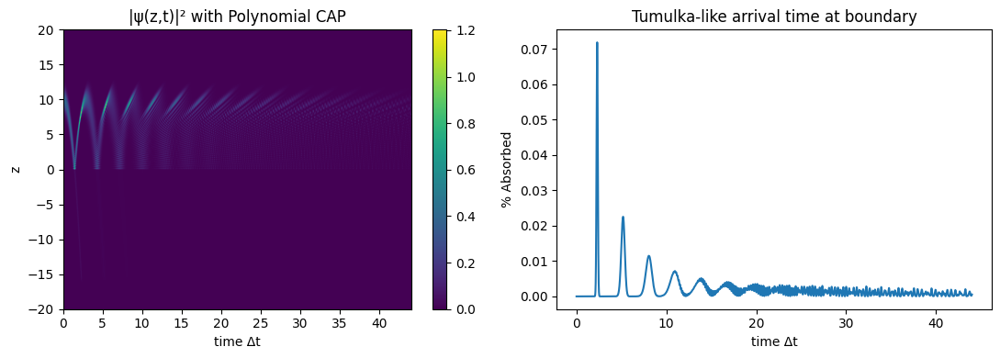

In [8]:
# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with Polynomial CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[:], (np.gradient(loss[:])) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Absorbed")
ax[1].set_title("Tumulka-like arrival time at boundary")
plt.tight_layout()
plt.show()

Let's try `gauss CAP`

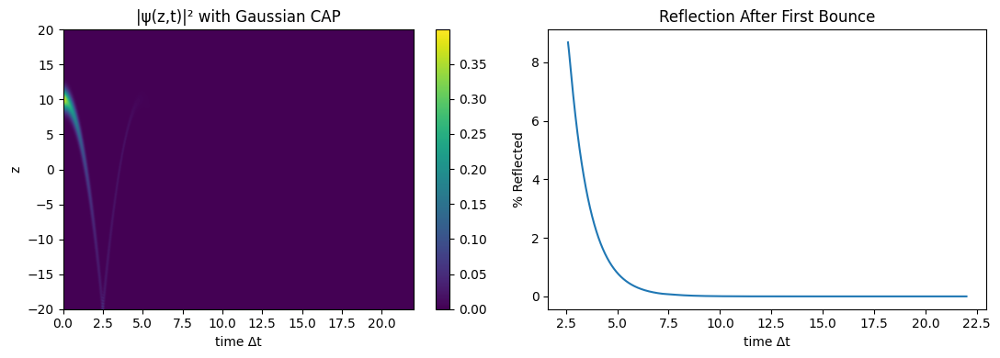

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Now plot the spacetime density
# plot_spacetime(prob_arr[2500:][:], z_array, t_vals[2500:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

barrier_params_delta = {'z0': 0.0, 'alpha': 0.0}
z_array, t_vals, prob_arr, loss, psi_history  = simulate_n(
	
	n_steps=22000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	# absorbing potential
	absorber_type="gauss_cap",
	absorber_params=dict(width=5.0, alpha=2, eta=0.5),

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with Gaussian CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[2600:], (1-loss[2600:]) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Reflected")
ax[1].set_title("Reflection After First Bounce")
plt.tight_layout()
plt.show()

We skip gaussian bullshit - not what we want.

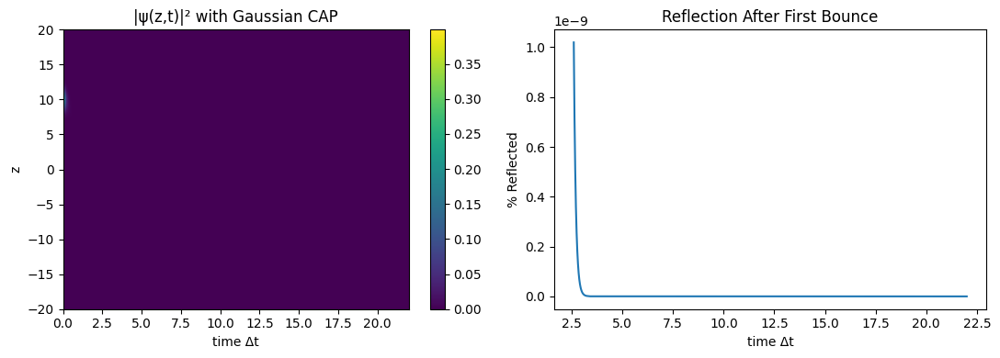

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Now plot the spacetime density
# plot_spacetime(prob_arr[2500:][:], z_array, t_vals[2500:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

barrier_params_delta = {'z0': 0.0, 'alpha': 0.0}
z_array, t_vals, prob_arr, loss, psi_history  = simulate_n(
	
	n_steps=22000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	# absorbing potential
	absorber_type="tfap_cap",
	absorber_params=dict(width=1.0, emin=10),

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with Gaussian CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[2600:], (1-loss[2600:]) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Reflected")
ax[1].set_title("Reflection After First Bounce")
plt.tight_layout()
plt.show()

rf_cap next

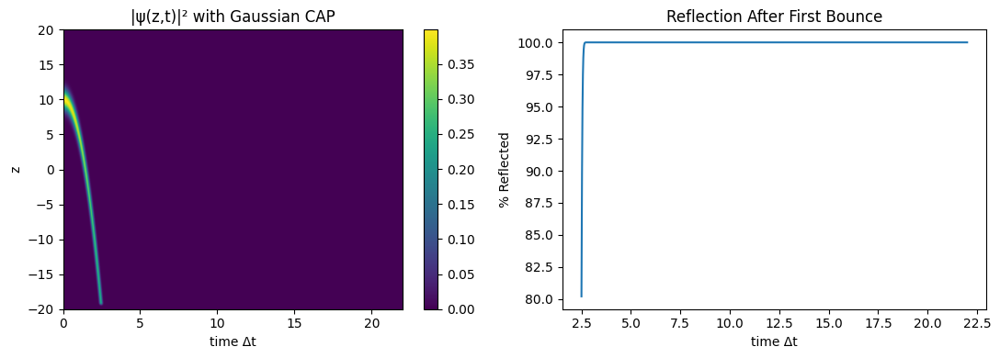

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Now plot the spacetime density
# plot_spacetime(prob_arr[2500:][:], z_array, t_vals[2500:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

barrier_params_delta = {'z0': 0.0, 'alpha': 0.0}
z_array, t_vals, prob_arr, loss, psi_history  = simulate_n(
	
	n_steps=22000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	# absorbing potential
	absorber_type="rf_cap",
	absorber_params=dict(width=1.0, eta_rf=1000),

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with Gaussian CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[2500:], (loss[2500:]) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Reflected")
ax[1].set_title("Reflection After First Bounce")
plt.tight_layout()
plt.show()

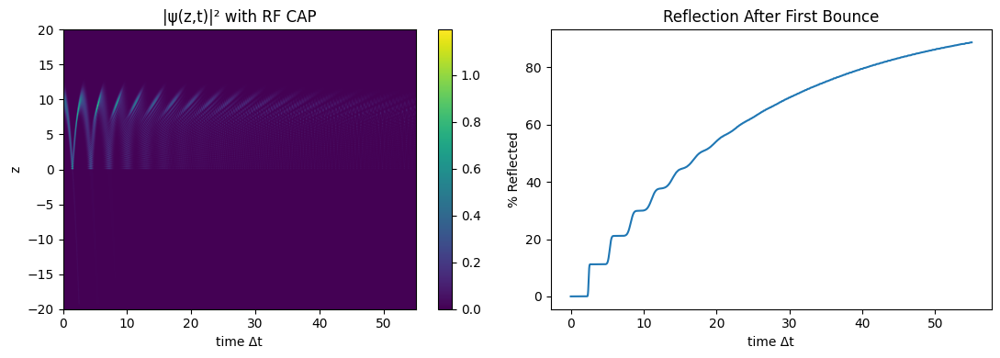

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Now plot the spacetime density
# plot_spacetime(prob_arr[2500:][:], z_array, t_vals[2500:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

barrier_params_delta = {'z0': 0.0, 'alpha': 25.0}
z_array, t_vals, prob_arr, loss, psi_history  = simulate_n(
	
	n_steps=55000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	# absorbing potential
	absorber_type="rf_cap",
	absorber_params=dict(width=1.0, eta_rf=1000),

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with RF CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[:], (loss[:]) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Reflected")
ax[1].set_title("Reflection After First Bounce")
plt.tight_layout()
plt.show()

This actually doesn't look so bad!

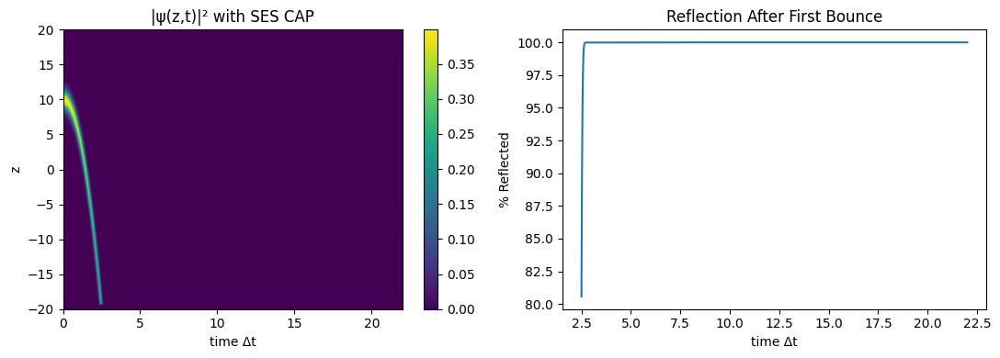

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Now plot the spacetime density
# plot_spacetime(prob_arr[2500:][:], z_array, t_vals[2500:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

barrier_params_delta = {'z0': 0.0, 'alpha': 0.0}
z_array, t_vals, prob_arr, loss, psi_history  = simulate_n(
	
	n_steps=22000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	# absorbing potential
	absorber_type="ses_cap",
	absorber_params=dict(width=1.0, theta=40),

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with SES CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[2500:], (loss[2500:]) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Reflected")
ax[1].set_title("Reflection After First Bounce")
plt.tight_layout()
plt.show()

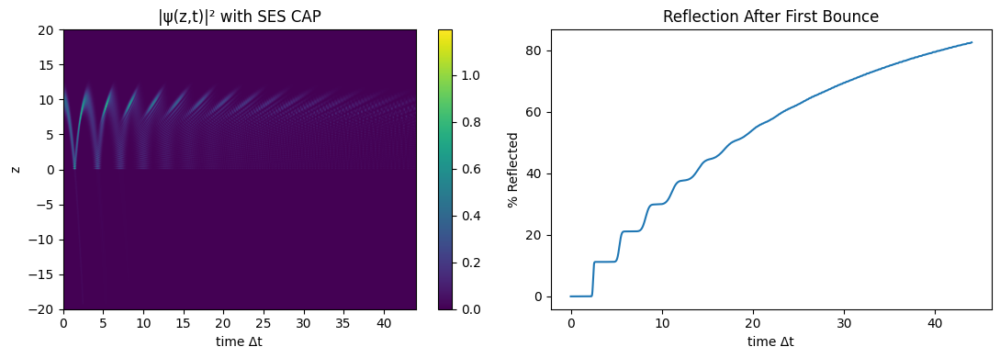

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Now plot the spacetime density
# plot_spacetime(prob_arr[2500:][:], z_array, t_vals[2500:], title="Boundary Absorption - First Bounce - Polynomial CAP", log_scale=True)

barrier_params_delta = {'z0': 0.0, 'alpha': 25.0}
z_array, t_vals, prob_arr, loss, psi_history  = simulate_n(
	
	n_steps=44000,
	dt=0.001,
	x_min=-20, x_max=20, Nx=512,

	#
	barrier_type='delta',
	barrier_params=barrier_params_delta,

	# absorbing potential
	absorber_type="ses_cap",
	absorber_params=dict(width=1.0, theta=40),

	# initial wave function
	z0_packet=10.0,
	p0_packet=0.0
)

# Now plot the spacetime density
# plot_spacetime(prob_arr, z_array, t_vals, title="Boundary Absorption Test - Cosine Mask")
fig, ax = plt.subplots(1, 2, figsize=(11, 4))
# density plot
im = ax[0].imshow(prob_arr.T, aspect="auto", origin="lower",
					extent=[t_vals[0], t_vals[-1], z_array[0], z_array[-1]])
ax[0].set_xlabel("time Δt")
ax[0].set_ylabel("z")
ax[0].set_title("|ψ(z,t)|² with SES CAP")
fig.colorbar(im, ax=ax[0])
# absorption curve
ax[1].plot(t_vals[:], (loss[:]) * 100)
ax[1].set_xlabel("time Δt")
ax[1].set_ylabel("% Reflected")
ax[1].set_title("Reflection After First Bounce")
plt.tight_layout()
plt.show()

## Yoshida's Method for Improved Accuracy

In [313]:
import matplotlib.pyplot as plt

# for reloading of modules
import importlib
from helpers import bohmian_integrator
from helpers import logging, physics_1d_sim_with_damping, plotting_spin, video_spin, data
from helpers import bohmian_plotter

def reload_modules():
	importlib.reload(logging)
	
	importlib.reload(physics_1d_sim_with_damping)
	# importlib.reload(plotting_spin)
	# importlib.reload(video_spin)
	# importlib.reload(data)
	# importlib.reload(bohmian_integrator)
	# importlib.reload(bohmian_plotter)

# Call this whenever you need to reload the modules
reload_modules()

# Then your regular imports
from helpers.logging import *
from helpers.physics_1d_sim_with_damping import *

eta: 2000.0, n: 2


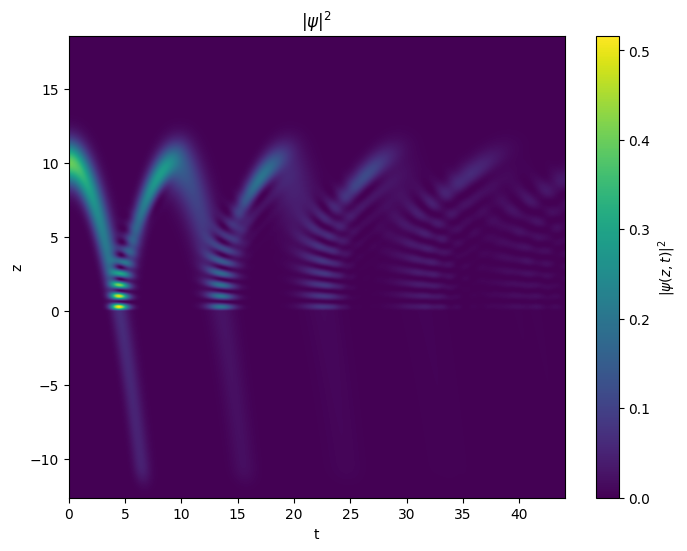

eta: 2000.0, n: 2


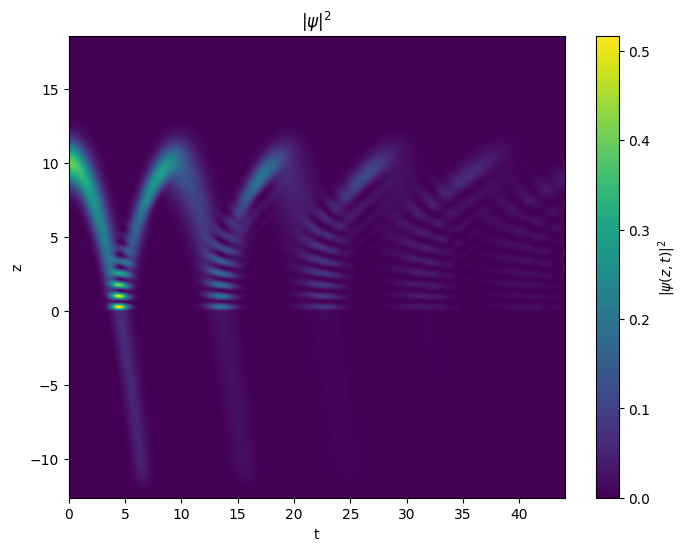

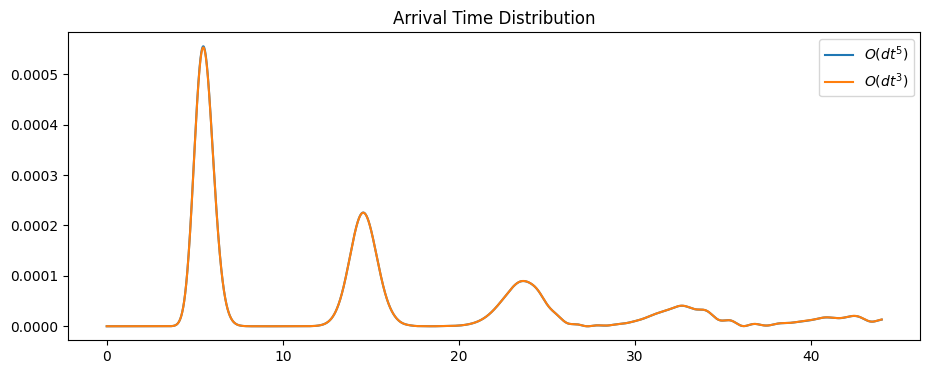

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Example usage: delta barrier
barrier_params_delta = {'z0': 0.0, 'alpha': 5.0}
params = {
	"n_steps":44000,
	"dt":0.001,
	"x_min":-40, "x_max":40, "Nx":512*2*2,

	#
	"barrier_type": 'delta',
	"barrier_params": barrier_params_delta,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"z0_packet": 10.0,
	"p0_packet": 0.0,

	"use_yoshida": True,
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)


# Now plot the spacetime density
plot_spacetime(prob_arr[:, 700:1500], z_array[700:1500], t_vals[:], title="$|\psi|^2$", log_scale=True)

J_yoshida = - (hbar / (m)) * np.imag( np.conj(psi_history) * np.gradient(psi_history, axis=0))

params = {
	"n_steps":44000,
	"dt":0.001,
	"x_min":-40, "x_max":40, "Nx":512*2*2,

	#
	"barrier_type": 'delta',
	"barrier_params": barrier_params_delta,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"z0_packet": 10.0,
	"p0_packet": 0.0,

	"use_yoshida": False,
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)


# Now plot the spacetime density
plot_spacetime(prob_arr[:, 700:1500], z_array[700:1500], t_vals[:], title="$|\psi|^2$", log_scale=True)

J_normal = - (hbar / (m)) * np.imag( np.conj(psi_history) * np.gradient(psi_history, axis=0))

dz = z_array[1]-z_array[0]
position = -5

JSlice_yoshida = J_yoshida[:, int(params["Nx"]/2+position/dz)]
JSlice_normal = J_normal[:, int(params["Nx"]/2+position/dz)]
fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:], label="$O(dt^5)$")
im = ax.plot(t_vals[:], JSlice_normal[:], label="$O(dt^3)$")
ax.set_title("Arrival Time Distribution")
ax.legend()
plt.show()

**TODO**
For proper analysis of arrival time, we'll compare a few absorbing masks at the edges of the simulation:
- Naive absorption + quantification of error
- CompleX Absorption Masks + comparison of a few of them
	- Quantification of "caused error"
	- Using non-reflective walls perhaps?!
- 

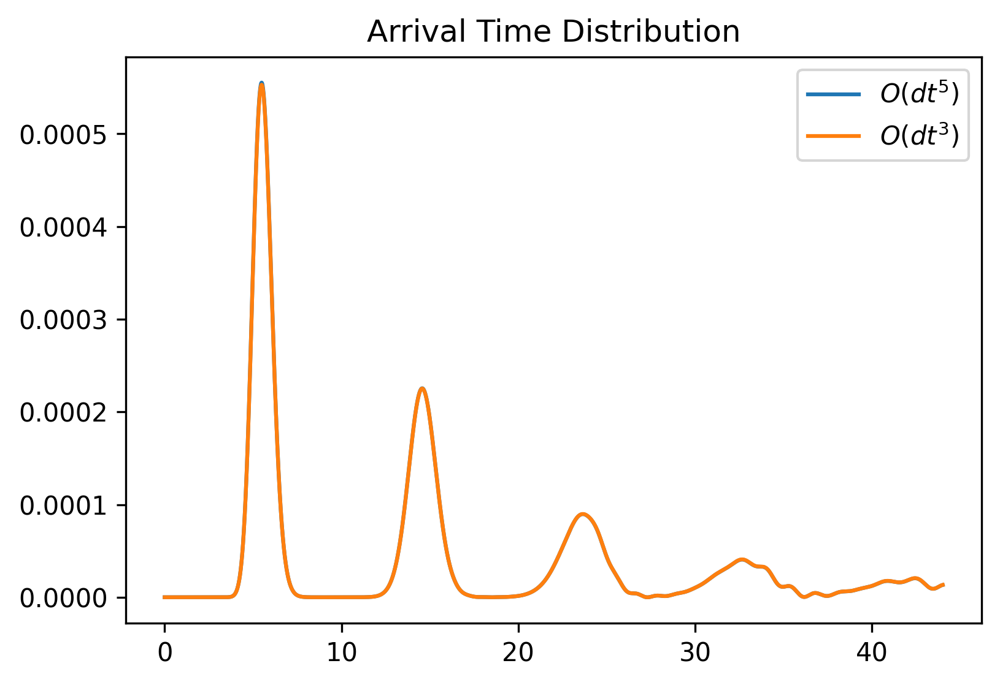

In [320]:
fix, ax = plt.subplots(1,1, figsize=(6,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:], label="$O(dt^5)$")
im = ax.plot(t_vals[:], JSlice_normal[:], label="$O(dt^3)$")
ax.set_title("Arrival Time Distribution")
ax.legend()
fix.dpi = 300
plt.show()

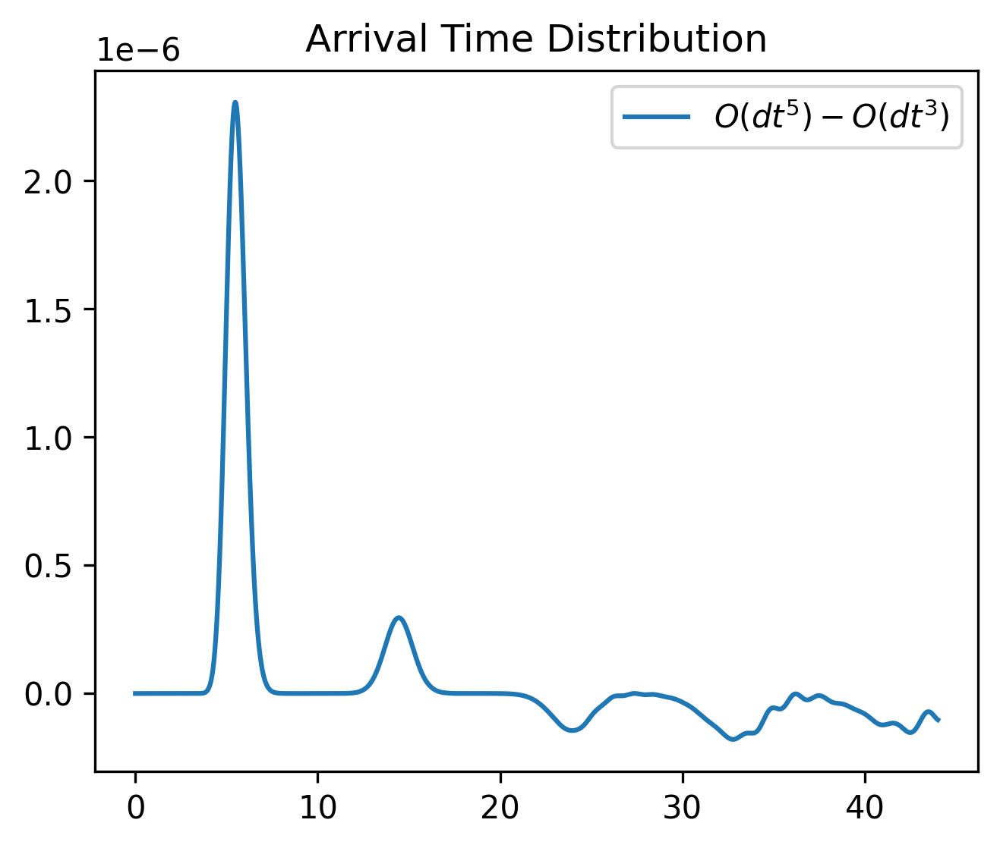

In [323]:
fix, ax = plt.subplots(1,1, figsize=(5,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:] - JSlice_normal[:], label="$O(dt^5) - O(dt^3)$")
ax.set_title("Arrival Time Distribution")
ax.legend()
fix.dpi = 300
plt.show()

In [6]:
np.std(JSlice_yoshida[:] - JSlice_normal[:])

3.734375078573808e-07

In [7]:
np.mean(JSlice_yoshida[:] - JSlice_normal[:])

2.0741817719247563e-07

## A little  Strong Barrier

eta: 2000.0, n: 2


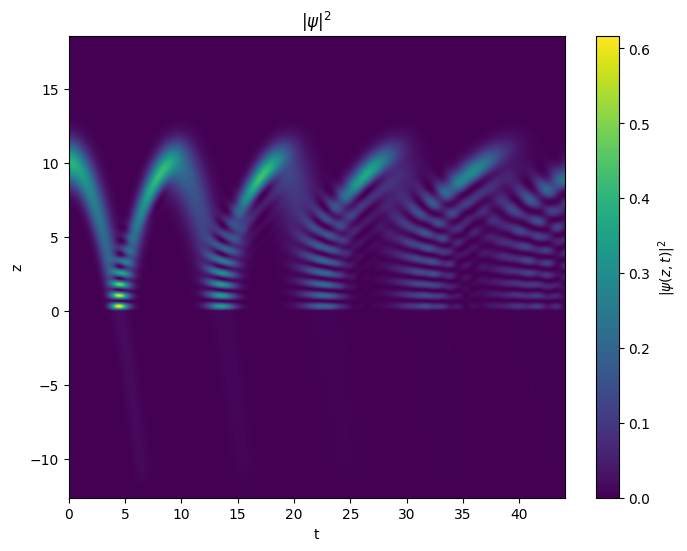

eta: 2000.0, n: 2


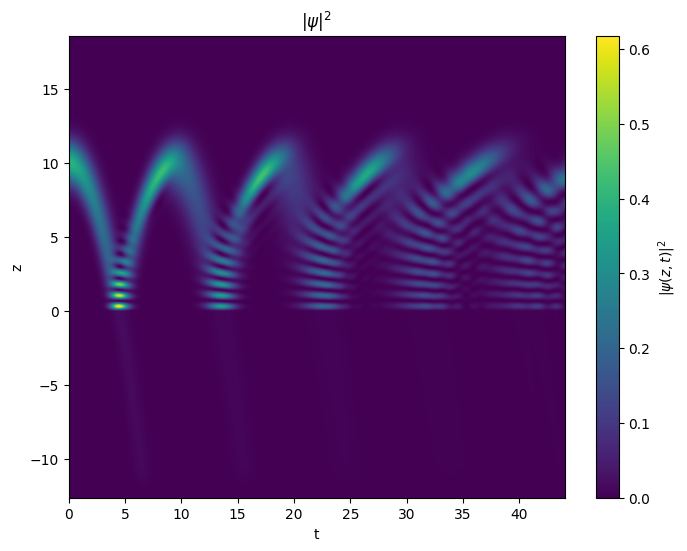

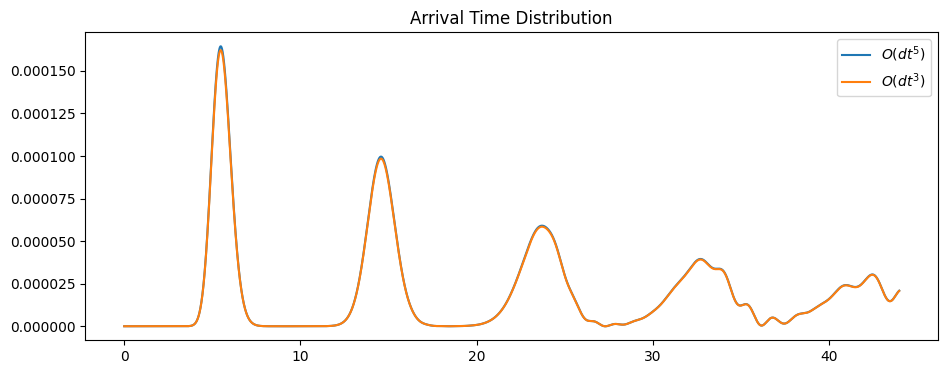

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Example usage: delta barrier
barrier_params_delta = {'z0': 0.0, 'alpha': 10.0}
params = {
	"n_steps":44000,
	"dt":0.001,
	"x_min":-40, "x_max":40, "Nx":512*2*2,

	#
	"barrier_type": 'delta',
	"barrier_params": barrier_params_delta,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"z0_packet": 10.0,
	"p0_packet": 0.0,

	"use_yoshida": True,
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)


# Now plot the spacetime density
plot_spacetime(prob_arr[:, 700:1500], z_array[700:1500], t_vals[:], title="$|\psi|^2$", log_scale=True)

J_yoshida = - (hbar / (m)) * np.imag( np.conj(psi_history) * np.gradient(psi_history, axis=0))

params = {
	"n_steps":44000,
	"dt":0.001,
	"x_min":-40, "x_max":40, "Nx":512*2*2,

	#
	"barrier_type": 'delta',
	"barrier_params": barrier_params_delta,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"z0_packet": 10.0,
	"p0_packet": 0.0,

	"use_yoshida": False,
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)


# Now plot the spacetime density
plot_spacetime(prob_arr[:, 700:1500], z_array[700:1500], t_vals[:], title="$|\psi|^2$", log_scale=True)

J_normal = - (hbar / (m)) * np.imag( np.conj(psi_history) * np.gradient(psi_history, axis=0))

dz = z_array[1]-z_array[0]
position = -5

JSlice_yoshida = J_yoshida[:, int(params["Nx"]/2+position/dz)]
JSlice_normal = J_normal[:, int(params["Nx"]/2+position/dz)]
fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:], label="$O(dt^5)$")
im = ax.plot(t_vals[:], JSlice_normal[:], label="$O(dt^3)$")
ax.set_title("Arrival Time Distribution")
ax.legend()
plt.show()

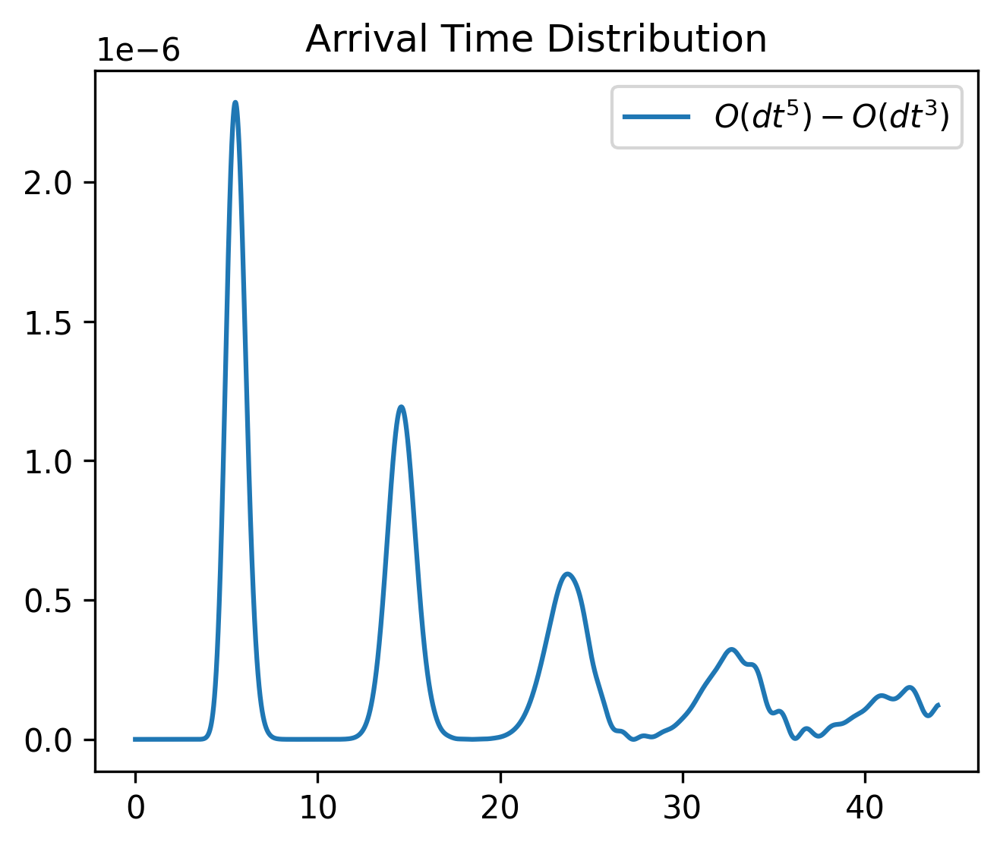

In [3]:
fix, ax = plt.subplots(1,1, figsize=(5,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:] - JSlice_normal[:], label="$O(dt^5) - O(dt^3)$")
ax.set_title("Arrival Time Dxistribution")
ax.legend()
fix.dpi = 300
plt.show()

In [15]:
JSlice_yoshida[:] / JSlice_normal[:]

ValueError: operands could not be broadcast together with shapes (200000,) (44000,) 

ValueError: operands could not be broadcast together with shapes (200000,) (44000,) 

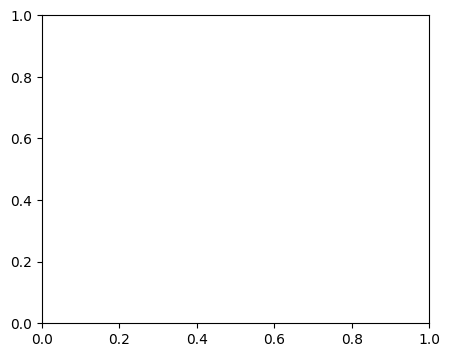

In [14]:
fix, ax = plt.subplots(1,1, figsize=(5,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:] / JSlice_normal[:], label="$O(dt^5) - O(dt^3)$")
ax.set_title("Arrival Time Dxistribution")
ax.legend()
fix.dpi = 300
plt.show()

In [11]:
np.max(np.abs(JSlice_yoshida[:])) / np.max(np.abs(JSlice_normal[:]))

0.29744324240291525

In [12]:
np.max(np.abs(JSlice_yoshida[:]))

0.00016446676589581982

In [13]:
np.max(np.abs(JSlice_normal[:]))

0.0005529349551435897

In [4]:
np.mean(JSlice_yoshida[:] - JSlice_normal[:])

2.0741817719247563e-07

## Yoshida Method - Long Term (200 seconds)

eta: 2000.0, n: 2
eta: 2000.0, n: 2


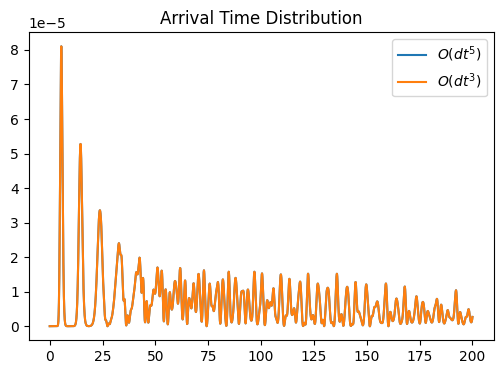

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

# Example usage: delta barrier
barrier_params_delta = {'z0': 0.0, 'alpha': 10.0}
params = {
	"n_steps":200000,
	"dt":0.001,
	"x_min":-40, "x_max":40, "Nx":512,

	#
	"barrier_type": 'delta',
	"barrier_params": barrier_params_delta,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"z0_packet": 10.0,
	"p0_packet": 0.0,

	"use_yoshida": True,
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

dz = z_array[1]-z_array[0]

# Now plot the spacetime density
# plot_spacetime(prob_arr[:, 700:1500], z_array[700:1500], t_vals[:], title="$|\psi|^2$", log_scale=True)

J = - (hbar / (m)) * np.imag( np.conj(psi_history) * np.gradient(psi_history, axis=0))
JSlice_yoshida = J[:, int(params["Nx"]/2+position/dz)]

del z_array, t_vals, prob_arr, loss, psi_history, V_tot, J

params = {
	"n_steps":200000,
	"dt":0.001,
	"x_min":-40, "x_max":40, "Nx":512,

	#
	"barrier_type": 'delta',
	"barrier_params": barrier_params_delta,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"z0_packet": 10.0,
	"p0_packet": 0.0,

	"use_yoshida": False,
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)


# Now plot the spacetime density
# plot_spacetime(prob_arr[:, 700:1500], z_array[700:1500], t_vals[:], title="$|\psi|^2$", log_scale=True)

J = - (hbar / (m)) * np.imag( np.conj(psi_history) * np.gradient(psi_history, axis=0))
JSlice_normal = J[:, int(params["Nx"]/2+position/dz)]

del z_array, prob_arr, loss, psi_history, V_tot, J


position = -5

fix, ax = plt.subplots(1,1, figsize=(6,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:], label="$O(dt^5)$")
im = ax.plot(t_vals[:], JSlice_normal[:], label="$O(dt^3)$")
ax.set_title("Arrival Time Distribution")
ax.legend()
fix.dpi = 300
plt.show()

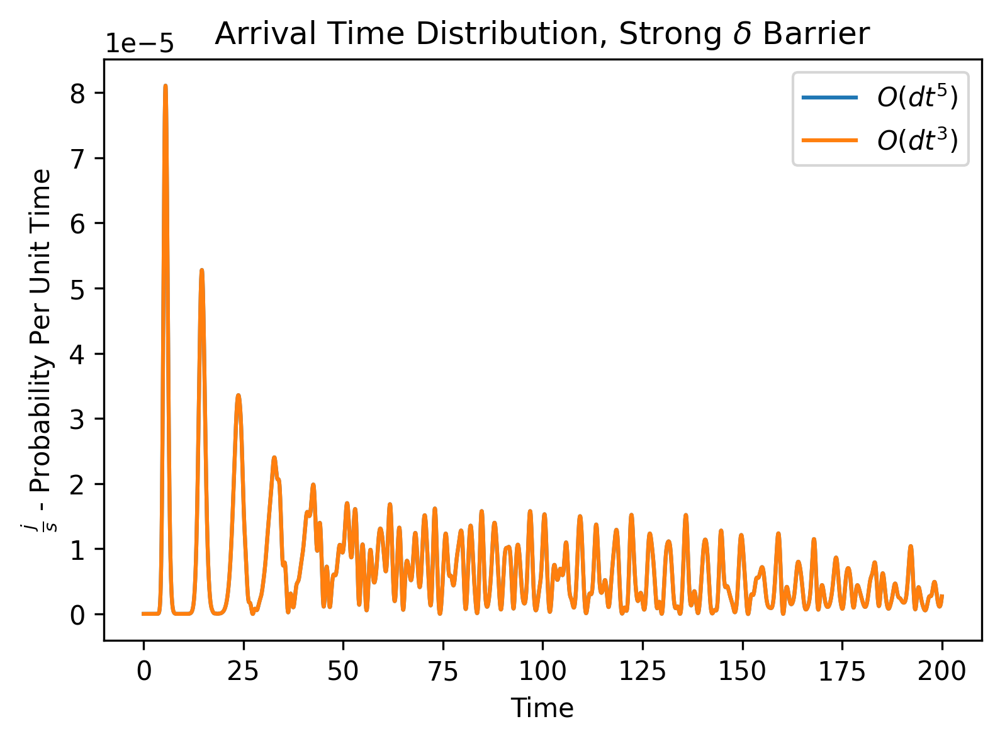

In [ ]:
fix, ax = plt.subplots(1,1, figsize=(6,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:], label="$O(dt^5)$")
im = ax.plot(t_vals[:], JSlice_normal[:], label="$O(dt^3)$")
ax.set_title("Arrival Time Distribution, Strong $\delta$ Barrier")
ax.set_xlabel("Time")
ax.set_ylabel("$\\frac{j}{s}$ - Probability Per Unit Time")
ax.legend()
fix.dpi = 300
plt.show()

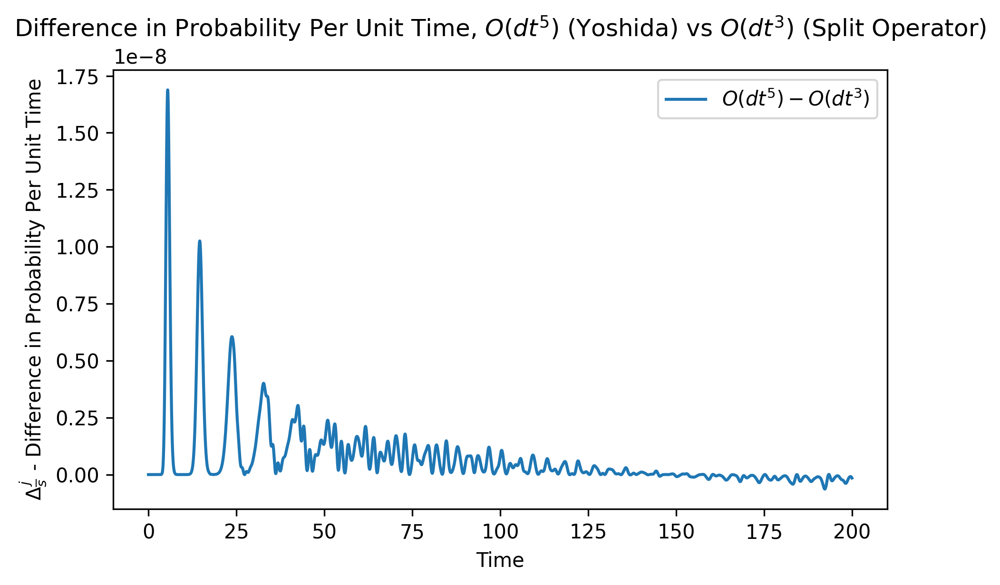

In [55]:
fix, ax = plt.subplots(1,1, figsize=(7,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:] - JSlice_normal[:], label="$O(dt^5) - O(dt^3)$")
ax.set_title("Difference in Probability Per Unit Time, $O(dt^5)$ (Yoshida) vs $O(dt^3)$ (Split Operator)")
ax.set_xlabel("Time")
ax.set_ylabel("$\Delta \\frac{j}{s}$ - Difference in Probability Per Unit Time")
ax.legend()
fix.dpi = 300
plt.show()

In [36]:
print (f"First Peak Ratio Difference:{1 - np.max(np.abs(JSlice_normal))/np.max(np.abs(JSlice_yoshida))}")

First Peak Ratio Difference:0.00020819176240538528


In [48]:
np.max(np.abs(JSlice_normal))

8.104462556258501e-05

In [49]:
np.max(np.abs(JSlice_yoshida))

8.106150189952871e-05

In [43]:
JSlice_yoshida[6000:] / JSlice_normal[6000:]

array([1.00021293, 1.00021293, 1.00021294, ..., 0.99994355, 0.99994356,
       0.99994356])

## Gaussian Barrier

eta: 2000.0, n: 2


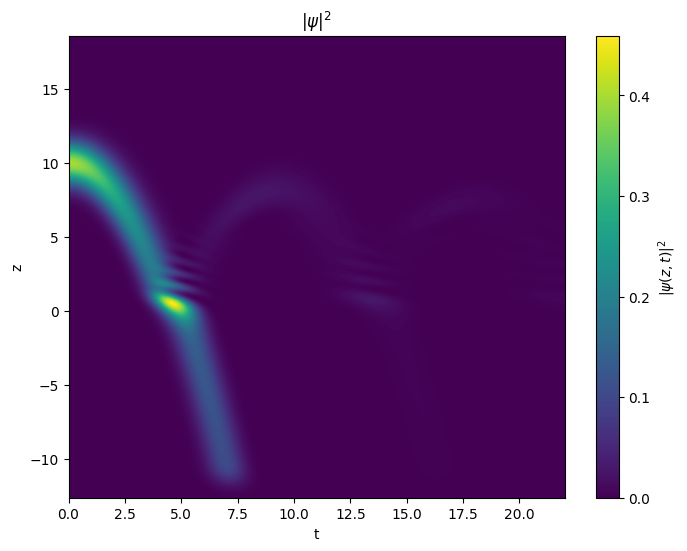

eta: 2000.0, n: 2


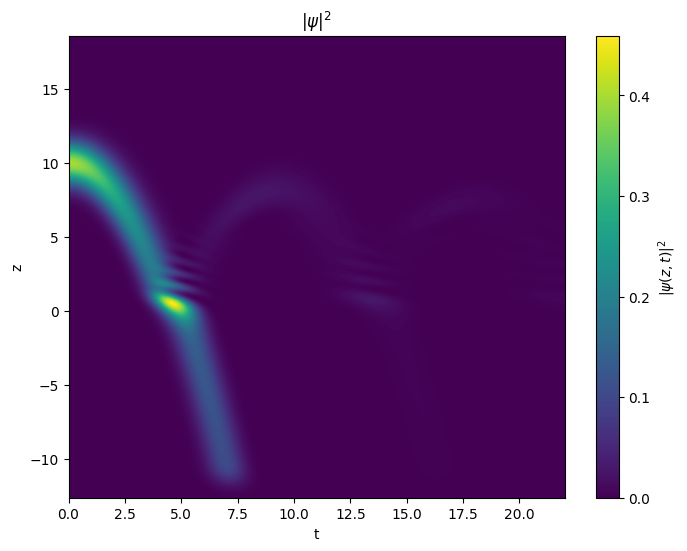

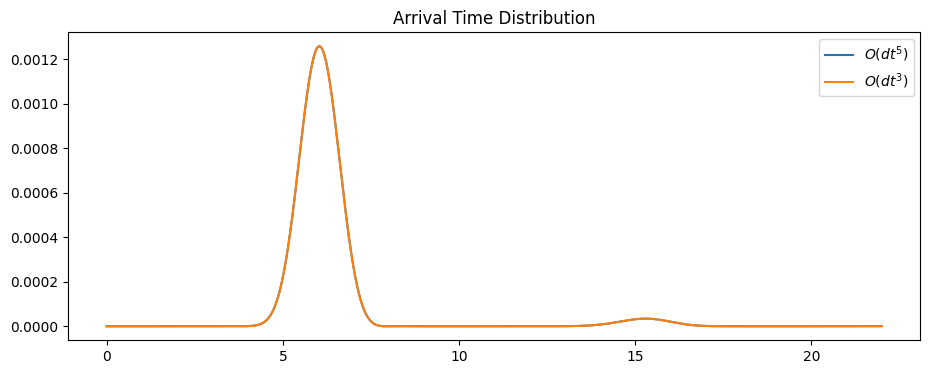

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

v0 = 8

# Example usage: delta barrier
barrier_params_gaussian = {'z0': 0.0, 'V0': v0, 'sigma': 1}
params = {
	"n_steps":22000,
	"dt":0.001,
	"x_min":-40, "x_max":40, "Nx":512*2*2,

	#
	"barrier_type": 'gaussian',
	"barrier_params": barrier_params_gaussian,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"z0_packet": 10.0,
	"p0_packet": 0.0,

	"use_yoshida": True,
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)


# Now plot the spacetime density
plot_spacetime(prob_arr[:, 700:1500], z_array[700:1500], t_vals[:], title="$|\psi|^2$", log_scale=True)

J_yoshida = - (hbar / (m)) * np.imag( np.conj(psi_history) * np.gradient(psi_history, axis=0))

params = {
	"n_steps":22000,
	"dt":0.001,
	"x_min":-40, "x_max":40, "Nx":512*2*2,

	#
	"barrier_type": 'gaussian',
	"barrier_params": barrier_params_gaussian,

	# absorbing potential
	"absorber_type": "poly_cap",
	"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

	# initial wave function
	"z0_packet": 10.0,
	"p0_packet": 0.0,

	"use_yoshida": False,
}
z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)


# Now plot the spacetime density
plot_spacetime(prob_arr[:, 700:1500], z_array[700:1500], t_vals[:], title="$|\psi|^2$", log_scale=True)

J_normal = - (hbar / (m)) * np.imag( np.conj(psi_history) * np.gradient(psi_history, axis=0))

dz = z_array[1]-z_array[0]
position = -5

JSlice_yoshida = J_yoshida[:, int(params["Nx"]/2+position/dz)]
JSlice_normal = J_normal[:, int(params["Nx"]/2+position/dz)]
fix, ax = plt.subplots(1,1, figsize=(11,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:], label="$O(dt^5)$")
im = ax.plot(t_vals[:], JSlice_normal[:], label="$O(dt^3)$")
ax.set_title("Arrival Time Distribution")
ax.legend()
plt.show()

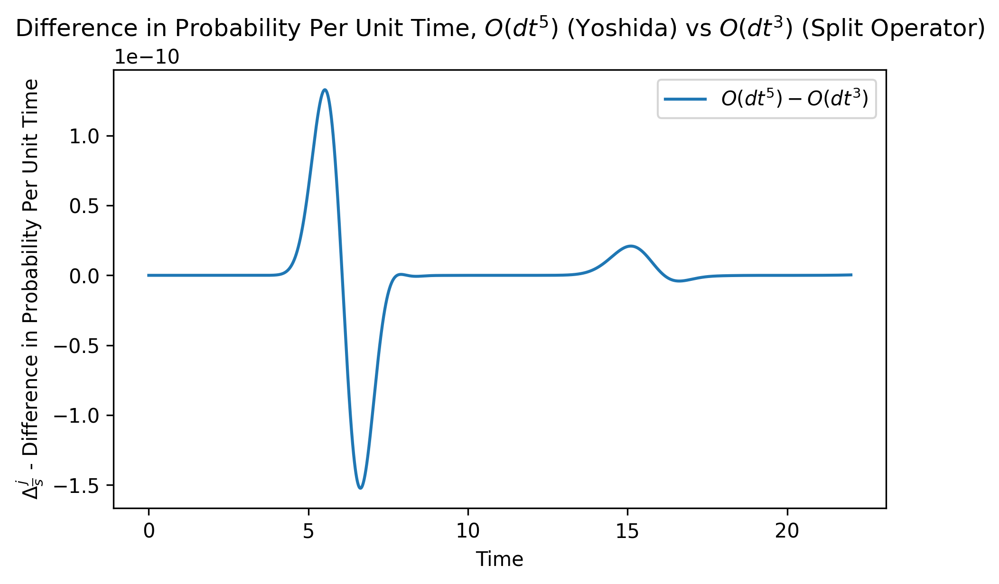

In [58]:
fix, ax = plt.subplots(1,1, figsize=(7,4))
im = ax.plot(t_vals[:], JSlice_yoshida[:] - JSlice_normal[:], label="$O(dt^5) - O(dt^3)$")
ax.set_title("Difference in Probability Per Unit Time, $O(dt^5)$ (Yoshida) vs $O(dt^3)$ (Split Operator)")
ax.set_xlabel("Time")
ax.set_ylabel("$\Delta \\frac{j}{s}$ - Difference in Probability Per Unit Time")
ax.legend()
fix.dpi = 300
plt.show()

## Gaussian Error Classification

eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2


eta: 2000.0, n: 2
eta: 2000.0, n: 2



Running simulations: 100%|██████████| 60/60 [03:29<00:00,  3.50s/it]


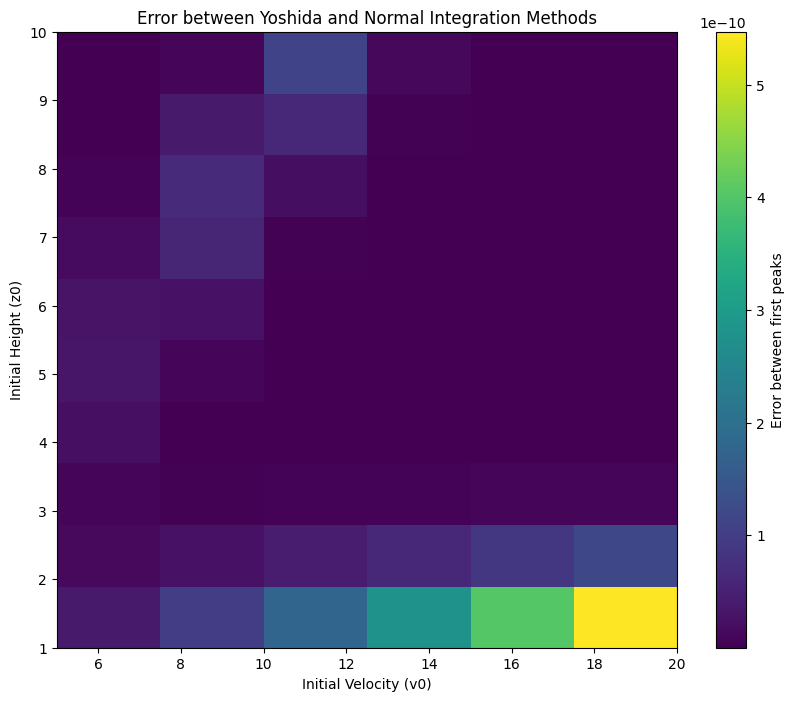

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  # For progress tracking

def find_first_peak(time_series, threshold=0.1):
	"""Find the first peak in a time series above threshold"""
	# Find where the series crosses the threshold
	above_threshold = time_series > threshold
	if not np.any(above_threshold):
		return None
	
	# Find the first peak after threshold
	start_idx = np.where(above_threshold)[0][0]
	peak_idx = start_idx + np.argmax(time_series[start_idx:])
	return peak_idx

def run_error_analysis():
	# Define parameter ranges
	z0_range = np.linspace(1, 10, 10)  # 10 heights from 1 to 10
	v0_range = np.arange(5, 21, 3)     # v0 from 5 to 20 in steps of 3
	
	# Initialize error matrix
	error_matrix = np.zeros((len(z0_range), len(v0_range)))
	
	# Common parameters
	base_params = {
		"n_steps": 22000,
		"dt": 0.001,
		"x_min": -40,
		"x_max": 40,
		"Nx": 512,
		"barrier_type": 'gaussian',
		"absorber_type": "poly_cap",
		"absorber_params": dict(width=30, n=2, eta=2000.0),
		"p0_packet": 0.0,
	}
	
	# Progress bar for tracking
	total_iterations = len(z0_range) * len(v0_range)
	pbar = tqdm(total=total_iterations, desc="Running simulations")
	
	# Run simulations for each combination
	for i, z0 in enumerate(z0_range):
		for j, v0 in enumerate(v0_range):
			# Update parameters
			barrier_params = {'z0': 0.0, 'V0': v0, 'sigma': 1}
			params = base_params.copy()
			params.update({
				"barrier_params": barrier_params,
				"z0_packet": z0,
			})
			
			# Run Yoshida simulation
			params["use_yoshida"] = True
			z_array, t_vals, _, _, psi_history, _ = simulate_n(**params)
			J_yoshida = -(hbar / m) * np.imag(np.conj(psi_history) * np.gradient(psi_history, axis=0))
			
			# Run normal simulation
			params["use_yoshida"] = False
			z_array, t_vals, _, _, psi_history, _ = simulate_n(**params)
			J_normal = -(hbar / m) * np.imag(np.conj(psi_history) * np.gradient(psi_history, axis=0))
			
			# Calculate current at specific position
			dz = z_array[1] - z_array[0]
			position = -5
			JSlice_yoshida = J_yoshida[:, int(params["Nx"]/2 + position/dz)]
			JSlice_normal = J_normal[:, int(params["Nx"]/2 + position/dz)]
			
			# Find first peaks
			peak_yoshida = np.max(np.abs(JSlice_yoshida))
			peak_normal = np.max(np.abs(JSlice_normal))
			
			# Calculate error if peaks were found
			if peak_yoshida is not None and peak_normal is not None:
				error = peak_yoshida - peak_normal
				error_matrix[i, j] = error
			
			pbar.update(1)
	
	pbar.close()
	return error_matrix, z0_range, v0_range

def plot_error_heatmap(error_matrix, z0_range, v0_range):
	plt.figure(figsize=(10, 8))
	plt.imshow(error_matrix, aspect='auto', origin='lower',
			   extent=[v0_range[0], v0_range[-1], z0_range[0], z0_range[-1]],
			   cmap='viridis')
	plt.colorbar(label='Error between first peaks')
	plt.xlabel('Initial Velocity (v0)')
	plt.ylabel('Initial Height (z0)')
	plt.title('Error between Yoshida and Normal Integration Methods')
	plt.show()

# Run the analysis
error_matrix, z0_range, v0_range = run_error_analysis()
plot_error_heatmap(error_matrix, z0_range, v0_range)

In [75]:
def plot_error_heatmap(error_matrix, z0_range, v0_range):
	plt.figure(figsize=(10, 8))
	plt.imshow(error_matrix, aspect='auto', origin='lower',
			   extent=[v0_range[0], v0_range[-1], z0_range[0], z0_range[-1]],
			   cmap='viridis')
	plt.colorbar(label='Error between first peaks (probability per unit time)')
	plt.xlabel('Initial Velocity (v0)')
	plt.ylabel('Initial Height (z0)')
	plt.title('Difference between Yoshida and Normal Integration Methods At First Peak')
	plt.show()

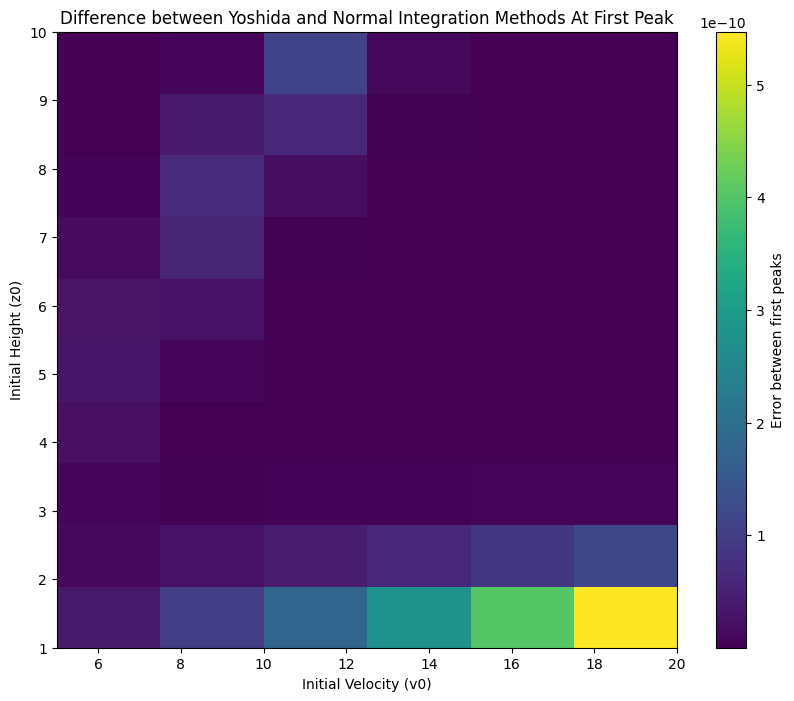

In [74]:
plot_error_heatmap(error_matrix, z0_range, v0_range)

## Arrival Time curves - Changing Height (Energy)

In [324]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# ------------------
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results_donna = {}
dt = 0.001

gamma_values = [5, 10, 15, 20]
for v0 in gamma_values:

	z0_values = [i*0.25 for i in range(4*35)]

	for z0 in z0_values:

		print (f"Doing run z0={z0}, at v0={v0}")

		# Example usage: delta barrier
		barrier_params_gaussian = {'z0': 0.0, 'V0': v0, 'sigma': 1}
		params = {
			"n_steps":50000,
			"dt": 0.001,
			"x_min":-40, "x_max":40, "Nx":512,

			#
			"barrier_type": 'gaussian',
			"barrier_params": barrier_params_gaussian,

			# apply_parabolic_dwell=False,
			# strength=100,
			# z_dwell_start=-10,

			# absorbing potential
			"absorber_type": "poly_cap",
			"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

			# initial wave function
			"z0_packet": z0,
			"p0_packet": 0.0,

			"use_yoshida": True
		}
		z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

		J = - (hbar / (m)) * np.imag(
				np.conj(psi_history) * np.gradient(psi_history, axis=0)
			)

		dz = z_array[1]-z_array[0]
		position = -5

		JSlice = J[:, int(params["Nx"]/2+position/dz)]

		if (v0 in j_results_donna):
			j_results_donna[v0].append(JSlice.copy())
		else:
			j_results_donna[v0] = []
			j_results_donna[v0].append(JSlice.copy())

		# memory cleaning
		del J, z_array, t_vals, prob_arr, loss, psi_history, V_tot

		# fix, ax = plt.subplots(1,1, figsize=(11,4))
		# im = ax.plot(t_vals[:], JSlice[:])
		# ax.set_title("Arrival Time Distribution")
		# fix.show()

Doing run z0=0.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=0.75, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=1.75, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=2.75, at v0=5
eta: 2000.0, n: 2
Doing run z0=3.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=3.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=3.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=3.75, at v0=5
eta: 2000.0, n: 2
Doing run z0=4.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=4.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=4.5, at v0=5
eta: 2000.0, n: 2
Doing run z0=4.75, at v0=5
eta: 2000.0, n: 2
Doing run z0=5.0, at v0=5
eta: 2000.0, n: 2
Doing run z0=5.25, at v0=5
eta: 2000.0, n: 2
Doing run z0=5.5, at 

In [ ]:
-----
# 1) Constants & Setup
# ------------------
hbar = 1.0
m = 1.0
g = 9.81

j_results_donna = {}
dt = 0.001

gamma_values = [5, 10, 15, 20]
for v0 in gamma_values:

	z0_values = [i*0.25 for i in range(4*35)]

	for z0 in z0_values:

		print (f"Doing run z0={z0}, at v0={v0}")

		# Example usage: delta barrier
		barrier_params_gaussian = {'z0': 0.0, 'V0': v0, 'sigma': 1}
		params = {
			"n_steps":50000,
			"dt": 0.001,
			"x_min":-40, "x_max":40, "Nx":512,

			#
			"barrier_type": 'gaussian',
			"barrier_params": barrier_params_gaussian,

			# apply_parabolic_dwell=False,
			# strength=100,
			# z_dwell_start=-10,

			# absorbing potential
			"absorber_type": "poly_cap",
			"absorber_params": dict(width=30, n=2, eta=2000.0), # eta = strength, n = polynomial steepness

			# initial wave function
			"z0_packet": z0,
			"p0_packet": 0.0,

			"use_yoshida": True
		}
		z_array, t_vals, prob_arr, loss, psi_history, V_tot  = simulate_n(**params)

		J = - (hbar / (m)) * np.imag(
				np.conj(psi_history) * np.gradient(psi_history, axis=0)
			)

		dz = z_array[1]-z_array[0]
		position = -5

		JSlice = J[:, int(params["Nx"]/2+position/dz)]

		if (v0 in j_results_donna):
			j_results_donna[v0].append(JSlice.copy())
		else:
			j_results_donna[v0] = []
			j_results_donna[v0].append(JSlice.copy())

		# memory cleaning
		del J, z_array, t_vals, prob_arr, loss, psi_history, V_tot

		# fix, ax = plt.subplots(1,1, figsize=(11,4))
		# im = ax.plot(t_vals[:], JSlice[:])
		# ax.set_title("Arrival Time Distribution")
		# fix.show()

In [460]:
t_vals = np.linspace(0, 0.001 * 50000, 50000)

import pickle
import datetime
import os

# # Create filename
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H-%M")
filename = os.path.join('./results/data', f'freefall_0_5_energy_change_yoshida_fourth_order_{timestamp}.pkl')

# # # # Save to pickle file
with open(filename, 'wb') as f:
	pickle.dump(j_results_donna, f)

# Load the data
# filename_0_5_v0_resolution = "freefall_1d_three_heights_seriesofbarrierstrengthds_20250513_11-37.pkl"
# filename_0_25_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"
# filename_0_125_v0_resolution = "freefall_0_25_accuracy_1d_three_heights_seriesofbarrierstrengthds_20250513_12-27.pkl"

filename_0_5_dropheight = "freefall_0_125_yoshida_fourth_order_20250515_23-28.pkl"

filename = os.path.join('./results/data', filename_0_5_dropheight)
j_results_donna = pickle.load(open(filename, 'rb'))

In [326]:
def find_first_peak(array, peak=0, threshold=0.0000001):
	"""
	Find the first significant peak in an array.
	
	Parameters:
	-----------
	array : numpy.ndarray
		The input array to analyze
	threshold : float, optional
		Minimum height difference to consider a point as a peak (default: 0.1)
		
	Returns:
	--------
	tuple
		(peak_index, peak_value) or (None, None) if no peak is found
	"""
	# Find all peaks using scipy's find_peaks
	from scipy.signal import find_peaks
	
	# Find peaks with minimum height difference
	# peaks, properties = find_peaks(array, prominence=0.1 * np.max(array))
	peaks, properties = find_peaks(array, height=np.max(array)*0.0001)
	
	if len(peaks) >= peak+1:
		# Get peak
		first_peak_idx = peaks[peak]
		first_peak_val = array[first_peak_idx]
		return first_peak_idx, first_peak_val
	else:
		return None, None


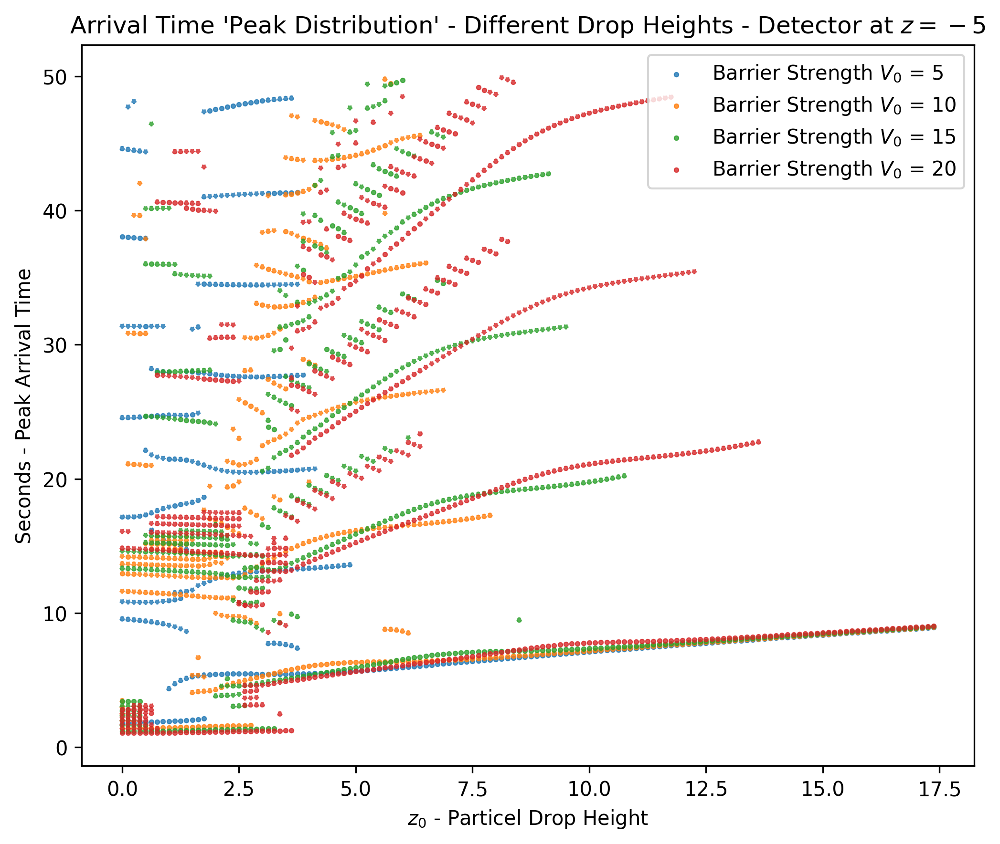

In [ ]:
peaks = 10

# Dictionary to store peak time values for all 7 peaks
peak_time_values = {i: {} for i in range(1, peaks)}  # 1 through 7 peaks

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():
	# Initialize lists for each peak
	for peak_num in range(1, peaks):
		peak_time_values[peak_num][z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		# Find all 7 peaks
		for peak_num in range(1, peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num - 1)  # peak_num - 1 because find_first_peak uses 0-based indexing
			
			if peak_idx is not None:
				peak_time_values[peak_num][z0].append([ii*0.125, peak_idx*dt])

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(7, 6))  # Slightly larger figure to accommodate more lines
fig.dpi = 300

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Define line styles for different peaks
line_styles = ['-', '--', ':', '-.', '--', ':', '-.']  # Different styles for each peak

# Plot each z0 value
for i, (z0, _) in enumerate(peak_time_values[1].items()):
	color = colors[i % len(colors)]  # Cycle through colors for different z0 values
	
	# Plot all 7 peaks for this z0
	for peak_num in range(1, peaks):
		
		label = f"Barrier Strength $V_0$ = {z0}" if peak_num == 1 else None

		if len(peak_time_values[peak_num][z0]) > 0:
			x, y = zip(*peak_time_values[peak_num][z0])
			ax.scatter(
				x, y,
				color=color,
				linestyle=line_styles[(peak_num - 1) % (len(line_styles)-1)],
				linewidths=0.5,
				s=5,
				alpha=0.8,
				label=label
			)

ax.set_title("Arrival Time 'Peak Distribution' - Different Drop Heights - Detector at $z=-5$")
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside to prevent overlap
ax.legend(loc='upper right')  # Move legend outside to prevent overlap
ax.set_xlabel("$z_0$ - Particel Drop Height")
ax.set_ylabel("Seconds - Peak Arrival Time")
plt.tight_layout()  # Adjust layout to prevent label cutoff
plt.show()

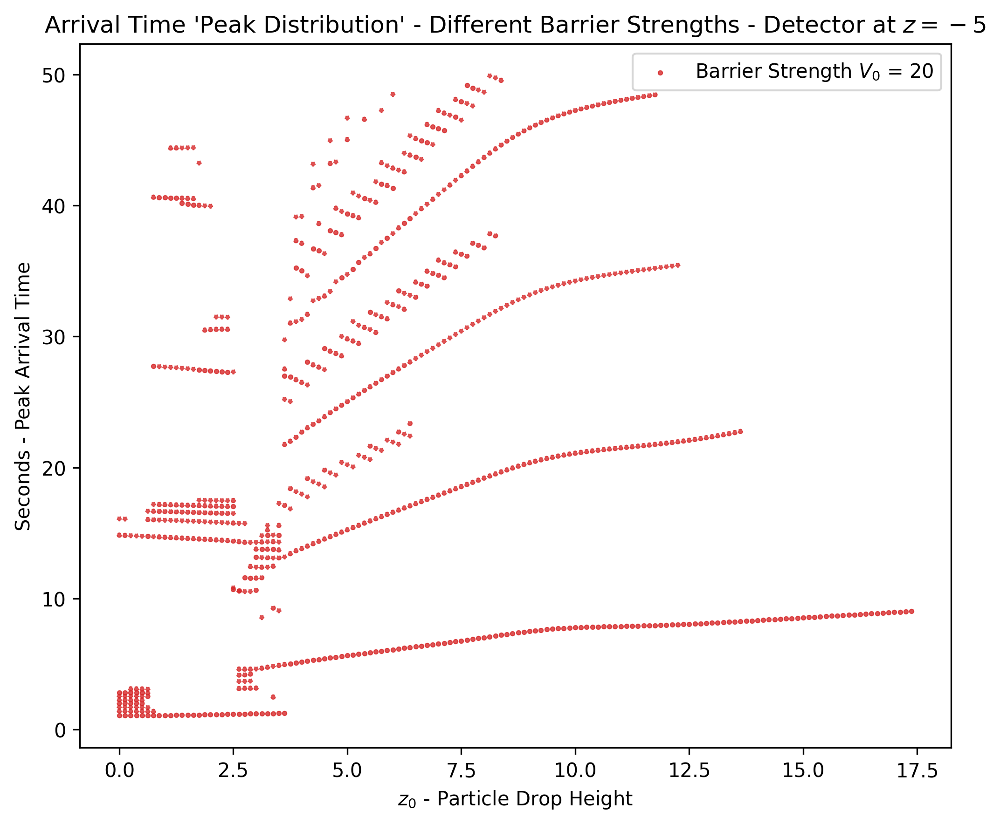

In [360]:
peaks = 10

# Dictionary to store peak time values for all 7 peaks
peak_time_values = {i: {} for i in range(1, peaks)}  # 1 through 7 peaks

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():
	# Initialize lists for each peak
	for peak_num in range(1, peaks):
		peak_time_values[peak_num][z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		# Find all 7 peaks
		for peak_num in range(1, peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num - 1)  # peak_num - 1 because find_first_peak uses 0-based indexing
			
			if peak_idx is not None:
				peak_time_values[peak_num][z0].append([ii*0.125, peak_idx*dt])

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(7, 6))  # Slightly larger figure to accommodate more lines
fig.dpi = 300

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Define line styles for different peaks
line_styles = ['-', '--', ':', '-.', '--', ':', '-.']  # Different styles for each peak

# Plot each z0 value
for i, (z0, _) in enumerate(peak_time_values[1].items()):

	if z0 != 20:
		continue

	color = colors[i % len(colors)]  # Cycle through colors for different z0 values
	
	# Plot all 7 peaks for this z0
	for peak_num in range(1, peaks):
		
		label = f"Barrier Strength $V_0$ = {z0}" if peak_num == 1 else None

		if len(peak_time_values[peak_num][z0]) > 0:
			x, y = zip(*peak_time_values[peak_num][z0])
			ax.scatter(
				x, y,
				color=color,
				linestyle=line_styles[(peak_num - 1) % (len(line_styles)-1)],
				linewidths=0.5,
				s=5,
				alpha=0.8,
				label=label
			)

ax.set_title("Arrival Time 'Peak Distribution' - Different Barrier Strengths - Detector at $z=-5$")
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside to prevent overlap
ax.legend(loc='upper right')  # Move legend outside to prevent overlap
ax.set_xlabel("$z_0$ - Particle Drop Height")
ax.set_ylabel("Seconds - Peak Arrival Time")

# ax.set_yscale('log')
# ax.set_xscale('log')

plt.tight_layout()  # Adjust layout to prevent label cutoff
plt.show()

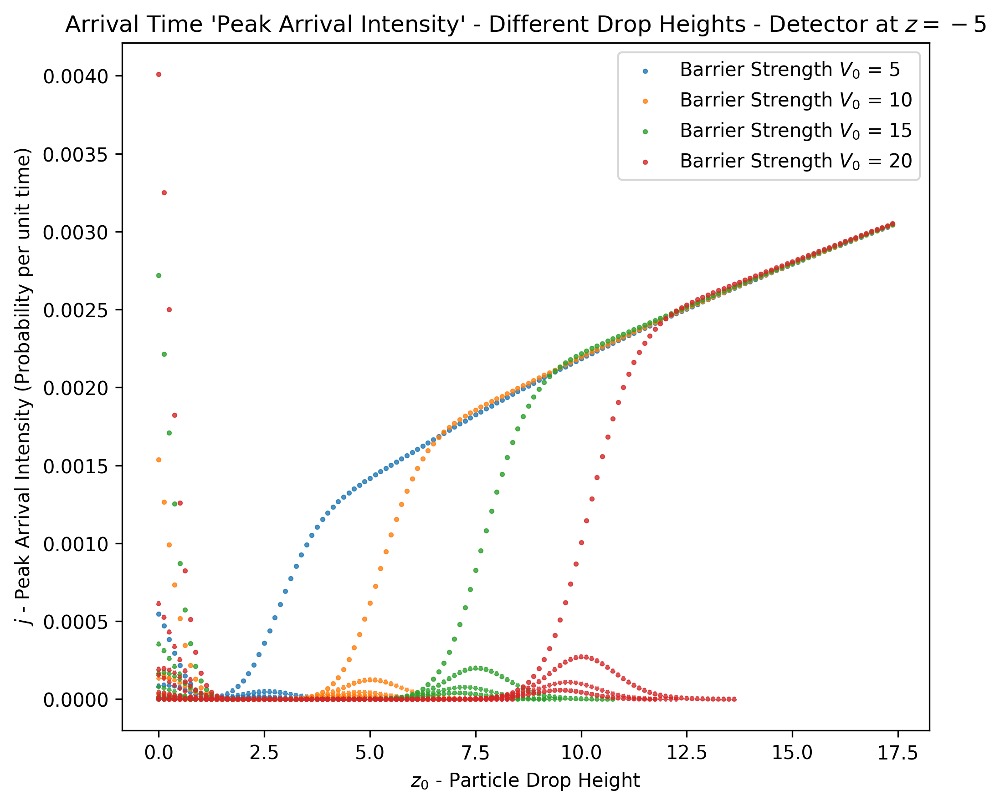

In [ ]:
peaks = 10

# Dictionary to store peak time values for all 7 peaks
peak_time_values = {i: {} for i in range(1, peaks)}  # 1 through 7 peaks

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():
	# Initialize lists for each peak
	for peak_num in range(1, peaks):
		peak_time_values[peak_num][z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		# Find all 7 peaks
		for peak_num in range(1, peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num - 1)  # peak_num - 1 because find_first_peak uses 0-based indexing
			
			if peak_idx is not None:
				peak_time_values[peak_num][z0].append([ii*0.125, peak_val])

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(7, 6))  # Slightly larger figure to accommodate more lines
fig.dpi = 300

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Define line styles for different peaks
line_styles = ['-', '--', ':', '-.', '--', ':', '-.']  # Different styles for each peak

# Plot each z0 value
for i, (z0, _) in enumerate(peak_time_values[1].items()):
	color = colors[i % len(colors)]  # Cycle through colors for different z0 values
	
	# Plot all 7 peaks for this z0
	for peak_num in range(1, peaks):
		
		label = f"Barrier Strength $V_0$ = {z0}" if peak_num == 1 else None

		if len(peak_time_values[peak_num][z0]) > 0:
			x, y = zip(*peak_time_values[peak_num][z0])
			ax.scatter(
				x, y,
				color=color,
				linestyle=line_styles[(peak_num - 1) % (len(line_styles)-1)],
				linewidths=0.5,
				s=5,
				alpha=0.8,
				label=label
			)

ax.set_title("Arrival Time 'Peak Arrival Intensity' - Different Drop Heights - Detector at $z=-5$")
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside to prevent overlap
ax.legend(loc='upper right')  # Move legend outside to prevent overlap
ax.set_xlabel("$z_0$ - Particle Drop Height")
ax.set_ylabel("$j$ - Peak Arrival Intensity (Probability per unit time)")
plt.tight_layout()  # Adjust layout to prevent label cutoff
plt.show()

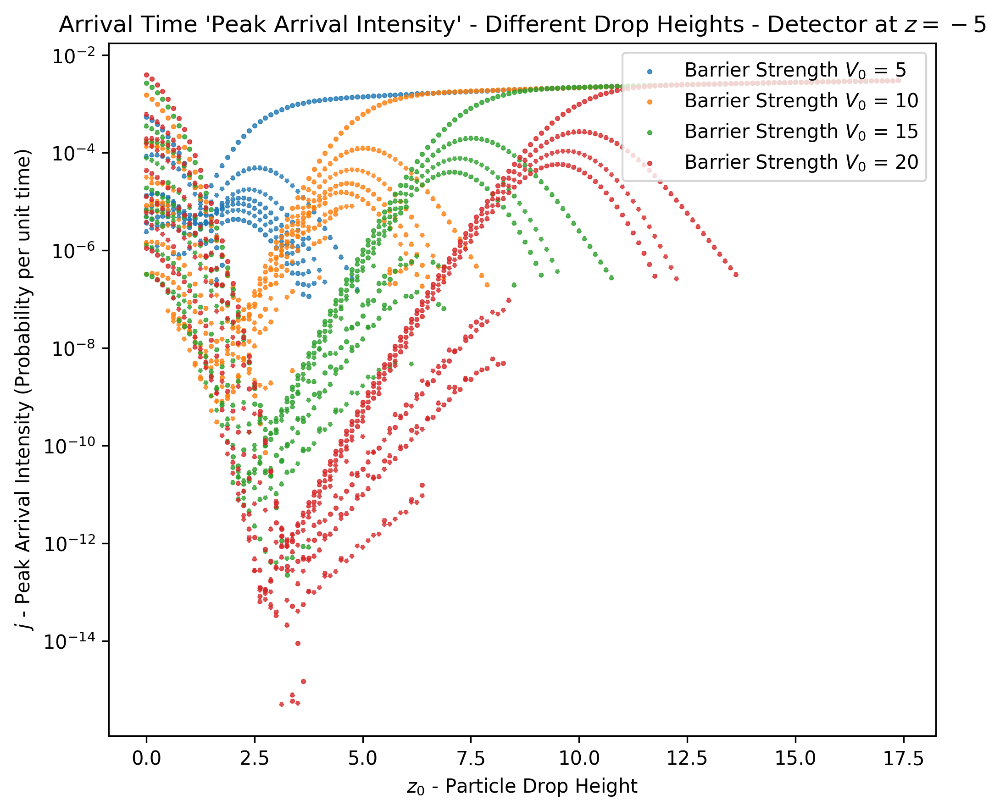

In [ ]:
peaks = 10

# Dictionary to store peak time values for all 7 peaks
peak_time_values = {i: {} for i in range(1, peaks)}  # 1 through 7 peaks

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():
	# Initialize lists for each peak
	for peak_num in range(1, peaks):
		peak_time_values[peak_num][z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		# Find all 7 peaks
		for peak_num in range(1, peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num - 1)  # peak_num - 1 because find_first_peak uses 0-based indexing
			
			if peak_idx is not None:
				peak_time_values[peak_num][z0].append([ii*0.125, peak_val])

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(7, 6))  # Slightly larger figure to accommodate more lines
fig.dpi = 300

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Define line styles for different peaks
line_styles = ['-', '--', ':', '-.', '--', ':', '-.']  # Different styles for each peak

# Plot each z0 value
for i, (z0, _) in enumerate(peak_time_values[1].items()):
	color = colors[i % len(colors)]  # Cycle through colors for different z0 values
	
	# Plot all 7 peaks for this z0
	for peak_num in range(1, peaks):
		
		label = f"Barrier Strength $V_0$ = {z0}" if peak_num == 1 else None

		if len(peak_time_values[peak_num][z0]) > 0:
			x, y = zip(*peak_time_values[peak_num][z0])
			ax.scatter(
				x, y,
				color=color,
				linestyle=line_styles[(peak_num - 1) % (len(line_styles)-1)],
				linewidths=0.5,
				s=5,
				alpha=0.8,
				label=label
			)

ax.set_title("Arrival Time 'Peak Arrival Intensity' - Different Drop Heights - Detector at $z=-5$")
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside to prevent overlap
ax.legend(loc='upper right')  # Move legend outside to prevent overlap
ax.set_xlabel("$z_0$ - Particle Drop Height")
ax.set_yscale('log')
ax.set_ylabel("$j$ - Peak Arrival Intensity (Probability per unit time)")
plt.tight_layout()  # Adjust layout to prevent label cutoff
plt.show()

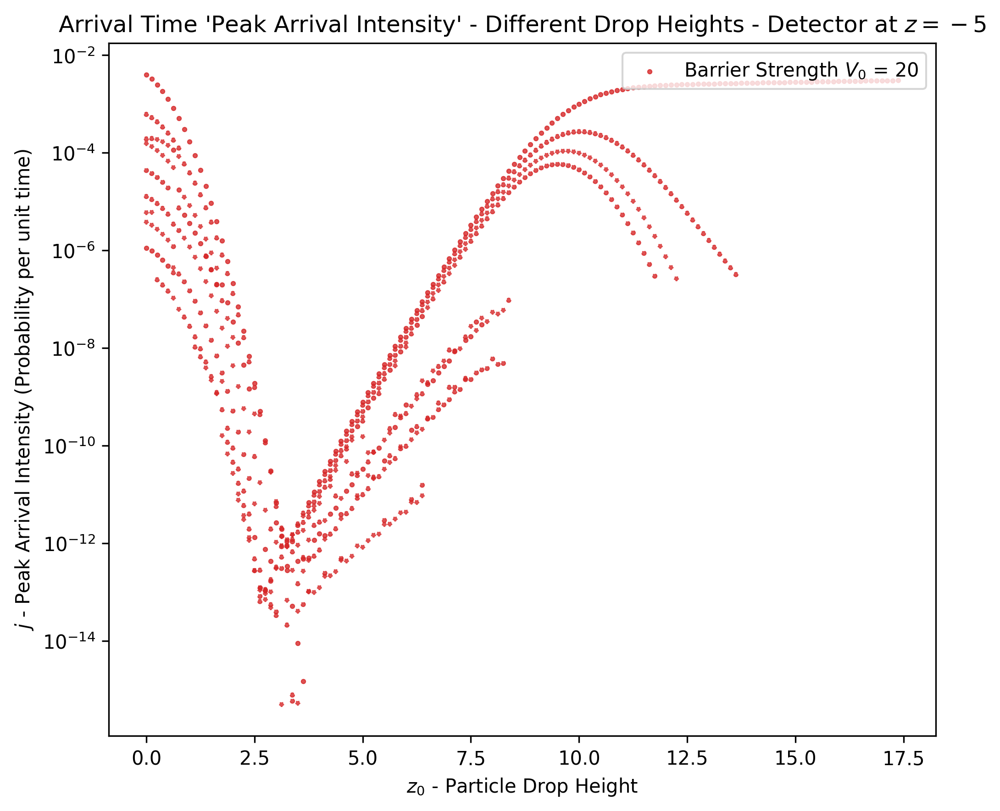

In [ ]:
peaks = 10

# Dictionary to store peak time values for all 7 peaks
peak_time_values = {i: {} for i in range(1, peaks)}  # 1 through 7 peaks

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():
	# Initialize lists for each peak
	for peak_num in range(1, peaks):
		peak_time_values[peak_num][z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		# Find all 7 peaks
		for peak_num in range(1, peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num - 1)  # peak_num - 1 because find_first_peak uses 0-based indexing
			
			if peak_idx is not None:
				peak_time_values[peak_num][z0].append([ii*0.125, peak_val])

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(7, 6))  # Slightly larger figure to accommodate more lines
fig.dpi = 300

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Define line styles for different peaks
line_styles = ['-', '--', ':', '-.', '--', ':', '-.']  # Different styles for each peak

# Plot each z0 value
for i, (z0, _) in enumerate(peak_time_values[1].items()):

	if z0 != 20:
		continue

	color = colors[i % len(colors)]  # Cycle through colors for different z0 values
	
	# Plot all 7 peaks for this z0
	for peak_num in range(1, peaks):
		
		label = f"Barrier Strength $V_0$ = {z0}" if peak_num == 1 else None

		if len(peak_time_values[peak_num][z0]) > 0:
			x, y = zip(*peak_time_values[peak_num][z0])
			ax.scatter(
				x, y,
				color=color,
				linestyle=line_styles[(peak_num - 1) % (len(line_styles)-1)],
				linewidths=0.5,
				s=5,
				alpha=0.8,
				label=label
			)

ax.set_title("Arrival Time 'Peak Arrival Intensity' - Different Drop Heights - Detector at $z=-5$")
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside to prevent overlap
ax.legend(loc='upper right')  # Move legend outside to prevent overlap
ax.set_xlabel("$z_0$ - Particle Drop Height")
ax.set_yscale('log')
ax.set_ylabel("$j$ - Peak Arrival Intensity (Probability per unit time)")
plt.tight_layout()  # Adjust layout to prevent label cutoff
plt.show()

## BArrier

In [361]:
dt

0.001

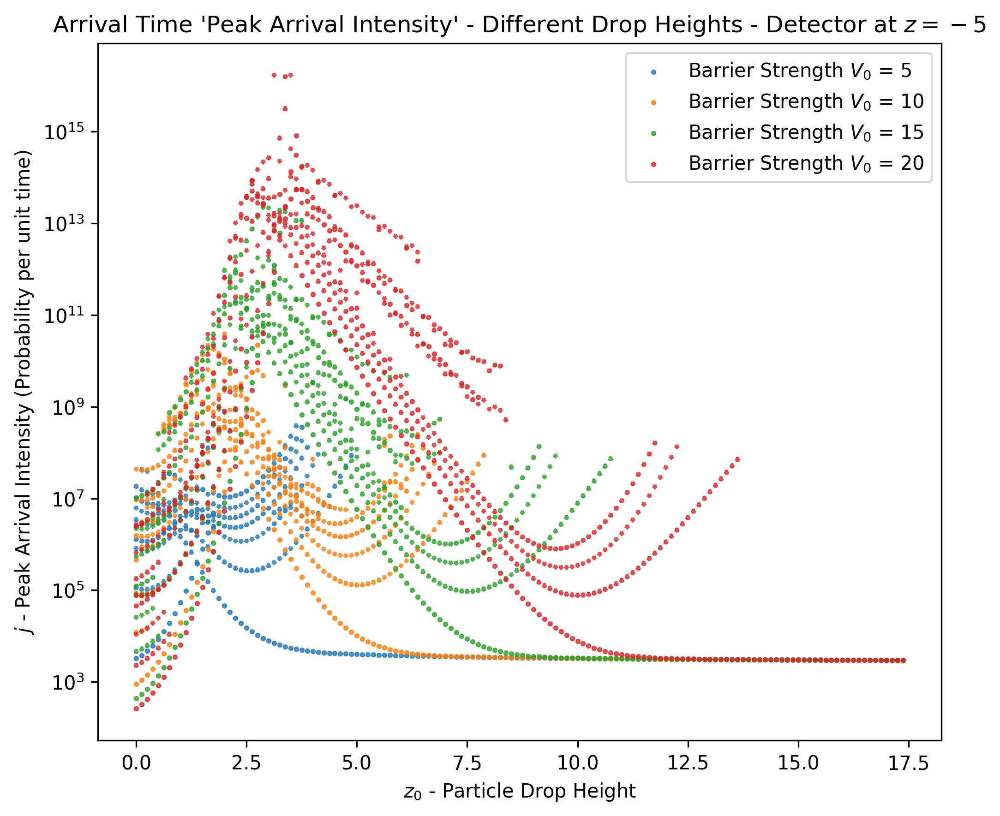

In [ ]:
peaks = 10

# Dictionary to store peak time values for all 7 peaks
peak_time_values = {i: {} for i in range(1, peaks)}  # 1 through 7 peaks

# go through each z0 result
for z0, j_for_v0_values in j_results_donna.items():
	# Initialize lists for each peak
	for peak_num in range(1, peaks):
		peak_time_values[peak_num][z0] = []

	# go through all j values for this slice
	for ii, j in enumerate(j_for_v0_values):
		# Find all 7 peaks
		for peak_num in range(1, peaks):
			peak_idx, peak_val = find_first_peak(j, peak_num - 1)  # peak_num - 1 because find_first_peak uses 0-based indexing
			
			if peak_idx is not None:
				peak_time_values[peak_num][z0].append([ii*0.125, t_vals[peak_idx] / peak_val ])

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(7, 6))  # Slightly larger figure to accommodate more lines
fig.dpi = 300

# Get the default color cycle
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# Define line styles for different peaks
line_styles = ['-', '--', ':', '-.', '--', ':', '-.']  # Different styles for each peak

# Plot each z0 value
for i, (z0, _) in enumerate(peak_time_values[1].items()):
	color = colors[i % len(colors)]  # Cycle through colors for different z0 values
	
	# Plot all 7 peaks for this z0
	for peak_num in range(1, peaks):
		
		label = f"Barrier Strength $V_0$ = {z0}" if peak_num == 1 else None

		if len(peak_time_values[peak_num][z0]) > 0:
			x, y = zip(*peak_time_values[peak_num][z0])
			ax.scatter(
				x, y,
				color=color,
				linestyle=line_styles[(peak_num - 1) % (len(line_styles)-1)],
				linewidths=0.5,
				s=5,
				alpha=0.8,
				label=label
			)

ax.set_title("Arrival Time 'Peak Arrival Intensity' - Different Drop Heights - Detector at $z=-5$")
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside to prevent overlap
ax.legend(loc='upper right')  # Move legend outside to prevent overlap
ax.set_xlabel("$z_0$ - Particle Drop Height")
ax.set_yscale('log')
ax.set_ylabel("$j$ - Peak Arrival Intensity (Probability per unit time)")
plt.tight_layout()  # Adjust layout to prevent label cutoff
plt.show()

## Test

In [10]:
import numpy as np
import matplotlib.pyplot as plt

Nx = 512
dx = 0.01


In [11]:
kx = 2*np.pi*np.fft.fftfreq(Nx, d=dx)      # shape (Nx,)

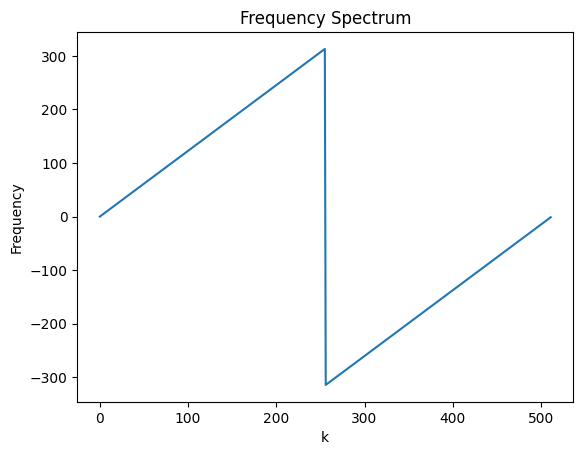

In [14]:
# plot kx
plt.plot(kx)
plt.xlabel("k")
plt.ylabel("Frequency")
plt.title("Frequency Spectrum")
plt.show()